### Importing the necessary libraries

In [4]:
!pip install heatmapz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from pylab import rcParams
import numpy as np
import pytz
import seaborn as sns
import missingno as msno
import warnings
warnings.filterwarnings("ignore")

import holidays
from datetime import datetime, timedelta, timezone
import calendar
from calendar import isleap

from tqdm import tqdm

from heatmap import heatmap, corrplot

import math

#rcParams['figure.figsize'] = 7,7
#sns.set(color_codes=True, font_scale=1.2)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2


In [6]:
import itertools
from itertools import cycle
from matplotlib.lines import Line2D


### Defining our functions

In [7]:
def nan_percentage(df):
  """
  Parameters:
  df : pd.Dataframe : the dataframe that we want to check for Nan values
  Returns: None

  This function takes as an input a dataframe and creates barplots with the % percentage of NaN values for each column.
  """
  values=[]
  cols=[]
  datetime_list =['Month','Year','Hour of the day','weekday','day_of_month','Day of the week']
  columns = [column for column in df.columns if column not in datetime_list]
  for col in columns :
  #for col in df.columns :#& ['month','year','hour_of_day','weekday','day_of_month','weekday_num']:
    #if col not in ('month','year','hour_of_day','weekday','day_of_month','weekday_num'):
      values = values +([(df.isna()[col].sum()/len(df)*100).round(2)])
      cols.append(col)
  sns.color_palette("light:b", as_cmap=True)
  plt.figure(figsize=(15,8))
  sns.barplot(x=values, y=cols, palette="light:b")
  plt.xticks(rotation=0)
  plt.xlabel("Percentage of missing values (%)")
  ##print(power_d.isna()[col].sum())


In [8]:
def nan_distribution(df):
  """
  Parameters:
  df: pd.Dataframe : the dataframe that we want to check for nan's distribution
  Returns:None

  This function takes as an input a dataframe and creates barplots with its datetimes attributes(hour of day/month etc.). Here in order to see the distribution of the NaNs
  we give as an input the df that contains only True, False values ( True if the the respective value at the intial df is Nan and False otherwise.)


  """
  ## creating color palettes for our barplots
  sns.set(font_scale = 1.3)
  datetime_list =['Month','Year','Hour of the day','weekday','day_of_month','Day of the week']
  columns = [column for column in df.columns ]
  columns = set(columns) ^ set(datetime_list)
  for col in columns :
          fig, ax = plt.subplots(1,4)

          fig.set_size_inches(25, 5)
          sns.barplot(x='Month', y=col, data=df,ax=ax[0], palette='Set3',hue='Year')
          ax[0].tick_params(axis='x', labelrotation=45)

          plt.xticks(fontsize=13, rotation=45)
          sns.barplot(x='Year', y=col, data=df,ax=ax[1],palette ="coolwarm")
          ax[1].tick_params(axis='x', labelrotation=45)

          plt.xticks(fontsize=13, rotation=45)
          sns.barplot(x='Hour of the day', y=col, data=df,ax=ax[2], palette='Blues_r')
          ax[2].tick_params(axis='x', labelrotation=45)

          plt.xticks(fontsize=13, rotation=45)
          sns.barplot(x='weekday', y=col, data=df,ax=ax[3],palette='vlag')
          ax[3].tick_params(axis='x', labelrotation=45)


          plt.xticks(fontsize=13, rotation=45)

In [9]:
def missing_df(df):
  """
  Parameters: df :pd.DataFrame :the dataframe we want to process

  Returns df_missing :pd.DataFrame : the dataframe that is the copy of the input dataframe and also has columns for each column to show whether the relevant column's data is NaN

 """
  df_missing=df.copy()
  columns_list = [col for col in df.columns]
  datetime_attrb = ['day_of_month', 'Month', 'Hour of the day', 'Year', 'weekday',
       'Day of the week']
  columns_list = set(columns_list) ^ set(datetime_attrb)

  for col in columns_list:
      df_missing["Missing " + col + "(%)"]=df.isna()[col]
      df_missing["Missing " + col + "(%)"]=df_missing["Missing " + col + "(%)"]*100

      df_missing=df_missing.drop(columns=col, axis=1)
  return df_missing

In [120]:
def create_countplots_per_day_and_hour(df, col,direction = 'Negative'):
    """
    Parameters:
    ----------
    df : pd.DataFrame
        The DataFrame containing the data.
    col : str
        The name of the column in df to be plotted.
    direction : str, optional
        The kind of values to be counted. Default is 'Negative'.
        Valid options are 'Negative' and 'Positive'.

    Returns:
    -------
    None

  """

    y = ['Day of the week', 'Hour of the day']
    weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    sns.set(font_scale=1.2)
    sns.set_style("whitegrid")

    for x in y:
        fig, ax = plt.subplots(1, 1)
        fig.set_size_inches(8, 4)
        if (direction=='Negative'):
            h = sns.countplot(data=df[df[col] < 0], x=x, palette="coolwarm")
            percentage = math.ceil((len(df[df[col] < 0]) / len(df)) * 100)

        if (direction=='Positive'):
            h = sns.countplot(data=df[df[col] > 0], x=x, palette="coolwarm")
            percentage = math.ceil((len(df[df[col]>0])/len(df))*100)



        h.set_yticklabels(h.get_yticks(), size=10)

        if x == 'Day of the week':
            h.set_xticklabels(weekdays, size=10)
        else:
            h.set_xticklabels(h.get_xticks(), size=10)

        # Add a title and axis labels
        ax.set_title(f"Counts of {direction} {col} by {x}", fontsize=12)
        ax.set_xlabel(x.capitalize(), fontsize=10)
        ax.set_ylabel("Count", fontsize=10)

        # Display the percentage of negative values
        ax.text(0.5, 0.9, f"{percentage}% of {col} is {direction}", transform=ax.transAxes,
                ha='center', fontsize=10)

        # Adjust the layout and spacing
        plt.tight_layout()

        # Show the plot
        plt.show()


In [121]:
def create_barplots(df,col):
  """
  Parameters:
  df : pd.DataFrame
        The DataFrame containing the data.
  col : str
        The name of the column in df to be plotted.
  Returns:
    None
        """

  y = ['weekday','hour_of_day']
  sns.set(font_scale = 2)


  for item in y:
     fig, ax = plt.subplots(1,1)

     fig.set_size_inches(8, 4)
     plt.xticks(rotation=45)
     h = sns.barplot(data=df, y=col ,x=item)
     h.set_yticklabels(h.get_yticks(), size = 8)
     h.set_xticklabels(h.get_xticks(), size = 8)



In [15]:
def create_correlation_mtrx(df):
  """
  Parameters:
  df : pd.DataFrame
        The DataFrame containing the data.
  Returns:
    None
        """

  corr_matrix = df.corr()
  sns.set(font_scale = 1)

  plt.figure(figsize=(30,15))
  sns.heatmap(corr_matrix,annot=True)


In [17]:
def create_power_plots(df, start_date, end_date, unit_of_msrmnt):
    """
    Parameters:
    df : pd.DataFrame : the DataFrame that contains the columns we want to plot
    start_date : str : the starting date of the plot
    end_date : str : the finishing date of the plot
    unit_of_msrmnt : str : the unit of measurement for the plotted values

    """
    plt.figure(figsize=(12, 6))

    for col in df.columns:
        if col in ('Active Power of W2', 'Active Power of W3', 'Active Power of W4', 'Active Power of W5', 'Active Power of W6'):
            df[start_date:end_date][col].plot(linewidth=2)

    plt.xticks(rotation=45, fontsize=10)
    plt.legend(bbox_to_anchor=(1.1, 1.05), prop={'size': 8})
    plt.title(f"Plots of Power Data from {start_date} to {end_date}", fontsize=12)
    plt.ylabel(f"Power ({unit_of_msrmnt})", fontsize=10)
    plt.xlabel("Date", fontsize=10)

    plt.show()


In [18]:
def remove_outliers(ts: pd.DataFrame,
                    std_dev: float = 10,
                    resolution: str = "5",
                    print_removed: bool = False,
                    col='Active Power of W4'):
    """
    Reads the input dataframe and replaces its outliers with NaNs by removing
    values that are more than std_dev standard deviations away from their 1 month
    mean. This function works with datasets that have NaN values.

    Parameters
    ----------
    ts : pd.DataFrame
        The pandas DataFrame to be processed.
    std_dev : float, optional
        The number to be multiplied with the standard deviation of
        each 1 month period of the dataframe. The result is then used as
        a cut-off value as described above. Default is 10.
    resolution : str, optional
        The resolution of the dataset. Default is "5".
    print_removed : bool, optional
        If True, it will print the removed values. Default is False.
    col : str, optional
        The column name to be processed. Default is 'Active Power of W4'.

    Returns
    -------
    Tuple[pd.DataFrame, pd.DataFrame]
        A tuple containing two DataFrames:
        - The original dataframe with its outlier values replaced with NaNs.
        - A DataFrame containing the removed outlier values.
    """

    #Dates with NaN values are removed from the dataframe
    ts = ts.dropna(subset=[col])
    #Removing all zero values if no negative values are present
    print("MIN", ts[col].min())
    if (ts[col].min() >= 0):
        a = ts.loc[ts[col] <= 0]
    else:
        a = ts.loc[ts[col] < ts[col].min()]
    #Calculating monthly mean and standard deviation and removing values
    #that are more than std_dev standard deviations away from the mean
    mean_per_month = ts.groupby(lambda x: x.month).mean()[col]
    mean = ts.index.to_series().apply(lambda x: mean_per_month[x.month])
    std_per_month = ts.groupby(lambda x: x.month).std()[col]
    std = ts.index.to_series().apply(lambda x: std_per_month[x.month])
    a = pd.concat([a, ts.loc[-std_dev * std + mean > ts[col]]])
    a = pd.concat([a, ts.loc[ts[col] > std_dev * std + mean]])

    #Plotting Removed values and new series
    a = a.sort_values(by='index')
    a = a[~a.index.duplicated(keep='first')]
    if print_removed: print(f"Removed from {col}", a)
    fig, ax = plt.subplots(figsize=(8,5))
    ax.plot(ts.index, ts[col], color='black', label = f'{col}')
    ax.scatter(a.index, a[col], color='blue', label = 'Removed Outliers')
    plt.xticks(rotation=45)
    plt.legend()


    res = ts.drop(index=a.index)
    fig, ax = plt.subplots(figsize=(8,5))
    ax.plot(res.index, res[col], color='black', label = f'{col} after Outlier Detection')
    plt.xticks(rotation=45)
    plt.legend()


    return res.resample(str(resolution) + "M").mean(), a


In [81]:
def create_heatmap(ts):
  """
  Parameters:
  ts : pd.DataFrame
        The DataFrame containing the data.
  Returns:
    None
        """
  datetime_list =['Month','Year','Hour of the day','weekday','day_of_month','weekday_num','Day of the week']
  columns = [column for column in ts.columns if column not in datetime_list]
  res = ts[columns]
  plt.figure(figsize=(8, 8))
  corrplot(res.corr(), size_scale=300);


In [21]:
def create_plots(df, start_date, end_date, unit_of_msrmnt,column=None):
    """
    Parameters:
    df : pd.DataFrame : the DataFrame that contains the column we want to plot
    start_date : str : the starting date of the plot
    end_date : str : the finishing date of the plot
    column : str : the name of the column that contains the values we want to plot
    unit_of_msrmnt : str : the unit of measurement for the plotted values

    Returns:
      None

    """
    plt.figure(figsize=(12, 6))

    if column is not None:
        df[start_date:end_date][column].plot(linewidth=2)
        plt.xticks(rotation=45, fontsize=10)
        plt.legend(bbox_to_anchor=(1.1, 1.05), prop={'size': 8})

        # Set the title, y-axis label, and x-axis label
        plt.title(f"Plot of {column} from {start_date} to {end_date}", fontsize=12)
        plt.ylabel("Value", fontsize=10)
        plt.xlabel("Date", fontsize=10)
    else:
        for col in df.columns:
            if col not in ('Month', 'Year', 'Hour of the day', 'weekday', 'day_of_month', 'Day of the week'):
                df[start_date:end_date][col].plot(linewidth=2)
                plt.xticks(rotation=45, fontsize=10)
                plt.legend(bbox_to_anchor=(1.1, 1.05), prop={'size': 8})

        # Set the title, y-axis label, and x-axis label
        plt.title(f"Plots from {start_date} to {end_date}", fontsize=12)
        plt.ylabel(f"Value ({unit_of_msrmnt})", fontsize=10)
        plt.xlabel("Date", fontsize=10)

    plt.show()



In [123]:
def isholiday(x, holiday_list):
    """
    Checks if a given date is a holiday.

    Parameters
    ----------
    x : datetime.date
        The date to check.
    holiday_list : List[str]
        A list of holidays.

    Returns
    -------
    bool
        True if the date is a holiday, False otherwise.
    """
    if x in holiday_list:
        return True
    return False


def isweekend(x):
    """
    Checks if a given weekday is a weekend day.

    Parameters
    ----------
    x : int
        The weekday (0-6), where 0 is Monday and 6 is Sunday.

    Returns
    -------
    bool
        True if the weekday is a weekend day, False otherwise.
    """
    if x == 6 or x == 0:
        return True
    return False


In [23]:
def create_calendar(timeseries, timestep_minutes, holiday_list):

    """
    Creates a calendar DataFrame based on the given timeseries.

    Parameters
    ----------
    timeseries : pd.DataFrame
        The input timeseries DataFrame.
    timestep_minutes : int
        The timestep interval in minutes.
    holiday_list : List[str]
        A list of holidays.

    Returns
    -------
    pd.DataFrame
        The calendar DataFrame with additional columns representing different time components.
    """

    calendar = pd.DataFrame(
        timeseries.index.tolist(),
        columns=['datetime']
    )
    calendar['datetime'] = pd.to_datetime(calendar['datetime'])

    calendar['year'] = calendar['datetime'].apply(lambda x: x.year)
    calendar['month'] = calendar['datetime'].apply(lambda x: x.month)
    calendar['yearweek'] = calendar['datetime'].apply(
        lambda x: int(x.strftime("%V")) - 1)
    calendar['day'] = calendar['datetime'].apply(lambda x: x.day)
    calendar['hour'] = calendar['datetime'].apply(lambda x: x.hour)
    calendar['minute'] = calendar['datetime'].apply(lambda x: x.minute)
    calendar['second'] = calendar['datetime'].apply(lambda x: x.second)
    calendar['weekday'] = calendar['datetime'].apply(lambda x: x.weekday())
    calendar['monthday'] = calendar['datetime'].apply(
        lambda x: int(x.strftime("%d")) - 1)
    calendar['weekend'] = calendar['weekday'].apply(lambda x: isweekend(x))
    calendar['yearday'] = calendar['datetime'].apply(
        lambda x: int(x.strftime("%j")) - 1)

    # first convert to utc and then to timestamp
    calendar['timestamp'] = calendar['datetime']
    #.apply(lambda x: local_timezone.localize(
     #   x).replace(tzinfo=pytz.utc).timestamp()).astype(int)

    # national_holidays = Province(name="valladolid").national_holidays()
    # regional_holidays = Province(name="valladolid").regional_holidays()
    # local_holidays = Province(name="valladolid").local_holidays()
    # holiday_list = national_holidays + regional_holidays + local_holidays

    calendar['holiday'] = calendar['datetime'].apply(
        lambda x: isholiday(x.date(), holiday_list))
    WNweekday = calendar['datetime'].apply(
        lambda x: x.weekday() if not isholiday(x.date(), holiday_list) else 5 if x.weekday() == 4 else 6)
    calendar['WN'] = WNweekday + calendar['hour']/24 + calendar['minute']/(24*60)
    return calendar


In [25]:
def read_csv_and_set_index(file,col=None,format=None,date_parse=None, separator = None):
  """
   Parameters: file : str: the name of the csv file that we want to save as df
               col : str : the name of the column we want to set as index

   Returns : df : pd.DataFrame : the df from the csv file, with col as index
"""
  if (date_parse is not None):
    dateparse = lambda x: datetime.strptime(x, '%Y%m%d%H%M%S')
    parse = [col]
  else :
    parse = False
    dateparse = None

  df = pd.read_csv(file,parse_dates=parse, date_parser=dateparse,sep=separator)
  if (col is not None):
    df = df.set_index(col)
  df.index=pd.to_datetime(df.index)
  return df

In [26]:
def impute(ts: pd.DataFrame,
           holidays,
           max_thr: int = 6*12,
           a: float = 0.025,
           wncutoff: float = 0.000694,
           ycutoff: int = 3,
           ydcutoff: int = 30,
           resolution: str = "5",
           debug: bool = False,
           name: str = "Active Power of W4",
           l_interpolation: bool = False,
           cut_date_val: str = "20221208",
           min_non_nan_interval: int = 24):
    """
    Reads the input dataframe and imputes the timeseries using a weighted average of historical data
    and simple interpolation. The weights of each method are exponentially dependent on the distance
    to the nearest non NaN value. More specifically, with increasing distance, the weight of
    simple interpolation decreases, and the weight of the historical data increases. If there is
    a consecutive subseries of NaNs longer than max_thr, then it is not imputed and returned with NaN
    values.

    Parameters
    ----------
    ts : pd.DataFrame
        The pandas DataFrame to be processed.
    holidays : List[str]
        The holidays of the country this timeseries belongs to.
    max_thr : int, optional
        If there is a consecutive subseries of NaNs longer than max_thr,
        then it is not imputed and returned with NaN values. If -1, every
        value will be imputed regardless of how long the consecutive
        subseries of NaNs it belongs to is, by default 6*12.
    a : float, optional
        The weight that shows how quickly simple interpolation's weight decreases as
        the distance to the nearest non NaN value increases, by default 0.025.
    wncutoff : float, optional
        Historical data will only take into account dates that have at most wncutoff distance
        from the current null value's WN, by default 0.000694.
    ycutoff : int, optional
        Historical data will only take into account dates that have at most ycutoff distance
        from the current null value's year, by default 3.
    ydcutoff : int, optional
        Historical data will only take into account dates that have at most ydcutoff distance
        from the current null value's yearday, by default 30.
    resolution : str, optional
        The resolution of the dataset, by default "5".
    debug : bool, optional
        If True, it will print helpful intermediate results, by default False.
    name : str, optional
        The name of the column to be imputed, by default "Active Power of W4".
    l_interpolation : bool, optional
        Whether to only use linear interpolation, by default False.
    cut_date_val : str, optional
        All dates before cut_date_val that have nan values are imputed using historical data
        from dates which are also before cut_date_val. Dates after cut_date_val are not affected
        by this, by default "20221208".
    min_non_nan_interval : int, optional
        If after imputation there exist continuous intervals of non-NaN values that are smaller than min_non_nan_interval
        hours, these intervals are all replaced by NaN values, by default 24.

    Returns
    -------
    pd.DataFrame
        The imputed dataframe.
    """
    from datetime import datetime,timedelta
    x=ts.copy()
    datetime_list =['month','year','hour_of_day','weekday','day_of_month','weekday_num']
    columns = [column for column in ts.columns if column not in datetime_list]
    for col in columns :#& ['Active Power of W4','Active Power of W6','Reactive Power of W4','Reactive Power of W6']:
        if max_thr == -1: max_thr = len(ts)
        if l_interpolation:
          res = ts[col].interpolate(inplace=False)
          imputed_values = res[ts[col].isnull()][col]
        else:
          #Returning calendar of the country ts belongs to
          calendar = create_calendar(ts, int(resolution), holidays)
          calendar.index = calendar["datetime"]
          imputed_values = ts[ts[col].isnull()]
          #null_dates: Series with all null dates to be imputed
          null_dates = imputed_values.index
          if debug:
            for date in null_dates:
              print(date)
          #isnull: An array which stores whether each value is null or not
          isnull = ts[col].isnull().values

          #d: List with distances to the nearest non null value
          d = [len(null_dates) for _ in range(len(null_dates))]

          #leave_nan: List with all the values to be left NaN because there are
          #more that max_thr consecutive ones
          leave_nan = [False for _ in range(len(null_dates))]

          #Calculating the distances to the nearest non null value that is earlier in the series
          count = 1
          count = 1
          for i in range(len(null_dates)):
              d[i] = min(d[i], count)
              if i < len(null_dates) - 1:
                  if null_dates[i+1] == null_dates[i] + pd.offsets.DateOffset(minutes=int(resolution)):
                      count += 1
                  else:
                      count = 1
                      #Calculating the distances to the nearest non null value that is later in the series
          count = 1
          for i in range(len(null_dates)-1, -1, -1):
              d[i] = min(d[i], count)
              if i > 0:
                  if null_dates[i-1] == null_dates[i] - pd.offsets.DateOffset(minutes=int(resolution)):
                      count += 1
                  else:
                      count = 1
          #for i in range(len(null_dates)):
          #  d[i] = min(d[i], count)
          #  if i < len(null_dates) - 1:
          #    next=(datetime.strptime(null_dates[i+1], '%Y-%m-%d %H:%M:%S')).strftime("%Y-%m-%d %H:%M:%S")
           #   current_plus5=((datetime.strptime(null_dates[i], '%Y-%m-%d %H:%M:%S'))+timedelta(minutes=5)).strftime("%Y-%m-%d %H:%M:%S")
            #  if next == current_plus5:
            #    count += 1
             # else:
              #  count = 1
          #count = 1
          #for i in range(len(null_dates)-1, -1, -1):
          #  d[i] = min(d[i], count)
          #  if i > 0:
           #   previous=(datetime.strptime(null_dates[i-1], '%Y-%m-%d %H:%M:%S')).strftime("%Y-%m-%d %H:%M:%S")
            #  current_minus5=((datetime.strptime(null_dates[i], '%Y-%m-%d %H:%M:%S'))-timedelta(minutes=5)).strftime("%Y-%m-%d %H:%M:%S")
             # if current_minus5==previous:
              #  count += 1
              #else:
              #  count = 1
           #If d[i] >= max_thr // 2, that means we have a consecutive subseries of NaNs longer than max_thr.
          #We mark this subseries so that it does not get imputed
          for i in range(len(null_dates)):
            if d[i] == max_thr // 2:
              for ii in range(max(0, i - max_thr // 2 + 1), min(i + max_thr // 2, len(null_dates))):
                leave_nan[ii] = True
            elif d[i] > max_thr // 2:
              leave_nan[i] = True


            #This is the interpolated version of the time series
          ts_interpolated = ts.interpolate(inplace=False)
          #We copy the time series so that we don't change it while iterating
          res = ts.copy()
          null_zip = [(i, null_date) for (i, null_date) in enumerate(null_dates) if not leave_nan[i]]
          for i, null_date in tqdm(null_zip):
              #WN: Day of the week + hour/24 + minute/(24*60). Holidays are handled as
              #either Saturdays(if the real day is a Friday) or Sundays(in every other case)
              currWN = calendar.loc[null_date]['WN']
              currYN = calendar.loc[null_date]['yearday']
              currY = calendar.loc[null_date]['year']
               #weight of interpolated series, decreases as distance to nearest known value increases
              w = np.e ** (-a * d[i])
              #Historical value is calculated as the mean of values that have at most wncutoff distance to the current null value's
              #WN, ycutoff distance to its year, and ydcutoff distance to its yearday
              #All dates before cut_date_val that have nan values are imputed using historical data
              #from dates which are also before cut_date_val
              l = (calendar['WN'] - currWN < wncutoff)
              b =(calendar['WN'] - currWN> -wncutoff)
              c = (calendar['year'] - currY < ycutoff)
              d = (calendar['year'] - currY> -ycutoff)
              e = ((calendar['yearday'] - currYN) % (365 + calendar['year'].apply(lambda x: isleap(x))) < ydcutoff)
              f  =((-calendar['yearday'] + currYN) % (365 + calendar['year'].apply(lambda x: isleap(x))) < ydcutoff)
              g = pd.to_datetime(ts[col].index) <pd.Timestamp(cut_date_val)
              if pd.Timestamp(null_date) < pd.Timestamp(cut_date_val):

                historical = ts[(~isnull) & (l & b & c  & d & g & (e |f))][col]


                #Dates after cut_date_val are not affected by cut_date_val
              else:
                historical = ts[(~isnull) & (l & b & c & d & (e |f))][col]


              #if debug: print("~~~~~~Date~~~~~~~",null_date, "~~~~~~~Dates summed~~~~~~~~~~",historical,sep="\n")

              historical = historical.mean()

              #imputed value is calculated as a wheighted average of the histrorical value and the value from intrepolation
              res.loc[null_date] = (w * ts_interpolated.loc[null_date][col] + (1 - w) * historical)
              value = (w * ts_interpolated.loc[null_date][col] + (1 - w) * historical)
              print(null_date,historical)
              x.at[null_date,col] = res.loc[null_date][col]
              # res.at[null_date , col][0] = x.loc[null_date][col]


                #imputed_values.loc[null_date] = res.loc[null_date][col]

              if debug:
                    print(x.loc[null_date][col])
    #If after imputation there exist continuous intervals of non nan values that are smaller than min_non_nan_interval
    #hours, these intervals are all replaced  by nan values
    not_nan_values = x[~x[col].isnull()]
    not_nan_dates = not_nan_values.index
    prev = not_nan_dates[0]
    start = prev
    for not_nan_day in not_nan_dates[1:]:
      if (not_nan_day - prev)!= pd.Timedelta(int(resolution), "min"):
        if prev - start < pd.Timedelta(min_non_nan_interval, "h"):
          print(f"Non Nan interval from {start} to {prev} is smaller than {min_non_nan_interval} h. Making this also Nan")
          for date in pd.date_range(start=start, end=prev, freq=str(resolution) + "M"):
            x.at[date,col] = pd.NA
        start = not_nan_day
      prev = not_nan_day
    if prev - start < pd.Timedelta(min_non_nan_interval, "h"):
      for date in pd.date_range(start=start, end=prev, freq=str(resolution) + "M"):
        x.at[date, col] = pd.NA

    x.to_csv("res.csv")

    return x


In [27]:
def barplot_of_positiveAndNegative(df, col):
    """
    Parameters:
    df : pd.DataFrame
          The DataFrame containing the data.
    col : str
          The name of the column in df to be plotted.
    Returns:
      None
        """

    positive_count = len(df[df[col] > 0])
    negative_count = len(df[df[col] < 0])

    data = {
        f'Positive {col}': [positive_count],
        f'Negative {col}': [negative_count]
    }
    df = pd.DataFrame(data=data)

    # Set the color palette
    colors = ['#1f77b4', '#ff7f0e']

    # Set the figure size and style
    plt.figure(figsize=(8, 6))
    sns.set(style='whitegrid')

    # Create the bar plot
    ax = sns.barplot(data=df, palette=colors)

    # Add labels and formatting
    plt.ylabel("Number of Values", fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    # Add value labels to the bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha='center', va='bottom', fontsize=10)

    # Set the y-axis to a logarithmic scale
    ax.set_yscale('log')
    ax.set_ylim(0.1, max(positive_count, negative_count) * 10)

    # Customize the plot aesthetics
    sns.despine(trim=True, left=True)
    ax.spines['bottom'].set_linewidth(1.5)
    ax.spines['left'].set_linewidth(1.5)
    ax.tick_params(axis='x', width=1.5)
    ax.tick_params(axis='y', width=1.5)

    # Add a light gray horizontal grid
    ax.yaxis.grid(True, color='lightgray')

    # Set the plot title
    plt.title(f'Positive and Negative {col} Counts', fontsize=14)

    # Adjust the layout to prevent labels from being cut off
    plt.tight_layout()

    # Show the plot
    plt.show()


In [29]:
def plot_with_value_counts(df,col,sort, unit_of_msrmnt =None):
    """
    Parameters:

    df (pd.DataFrame): The pandas DataFrame containing the data to be plotted.
    col (str): The column name in the DataFrame (df) representing the values to be plotted.
    sort (str): Specifies the type of values to take into consideration. It can take two possible values: 'negative' or 'positive'. If set to 'negative', the function will filter the DataFrame to consider only negative values for the given column. If set to 'positive', it will filter the DataFrame to consider only positive values for the given column.
    unit_of_msrmnt (str, optional): Specifies the unit of measurement for the plotted values. This parameter is not required and can be set to None by default.

    Returns
    -------
    None
    """
    if (sort == 'negative'):
      # Filter the data based on the condition
      filtered_df = df[df[col] < 0]
      custom_palette = sns.color_palette(["#C7E9C0", "#A1D99B", "#74C476", "#41AB5D", "#238B45"])
      sns.set_style("whitegrid")
    elif (sort=='positive'):
      filtered_df = df[df[col] > 0]
      custom_palette = sns.color_palette("Blues_r", n_colors=12)
      sns.set_style("whitegrid")


    # Plotting the bar plot with custom palette and value counts
    plt.figure(figsize=(10, 6))  # Adjust the figure size as desired
    ax = sns.countplot(x='Hour of the day', data = filtered_df, palette=custom_palette)

    # Add the count values on top of each bar

    plt.xlabel('Hour of the Day', fontsize=12)  # Adjust label font size
    plt.ylabel(f" Counts of {sort} {col} values", fontsize=12)  # Adjust label font size
    plt.title(col + ' per Hour of the Day', fontsize=14)  # Adjust title font size
    plt.xticks(fontsize=10)  # Adjust x-axis tick font size
    plt.yticks(fontsize=10)  # Adjust y-axis tick font size

    # Increase the width of the lines
    for axis in ['top', 'bottom', 'left', 'right']:
        ax.spines[axis].set_linewidth(1.5)

    plt.show()


In [30]:
def annual_lineplots(df, col, unit_of_msrmnt):
    """
    Above we plot lines where each line is a different year to demonstrate how values shift
    on average every year based on yearweek/weekday/hour.
    In the x-axis, we display the datetime (52/6/24 values for yearweeks/weekdays/hours per year respectively).
    In the y-axis, it is the average value of a given x-axis for that year
    Parameters:
    df : pd.DataFrame: The pandas DataFrame containing the data to be plotted.
    col : str: The column name in the DataFrame (df) representing the values to be plotted.
    unit_of_msrmnt : str : the unit of measurement for the plotted values

    ----------
    Returns: None
    -------
    """
    # Set the plot style
    sns.set_style("whitegrid")

    # make a list out of possible linestyle we want our line plots to have
    ls = ["-", "--", ":", "-.", "-", "--", ":", "-."]
    linecycler = cycle(ls)  # create an object that can circle around that list

    fig, ax = plt.subplots(figsize=(20, 10))  # Create a single subplot instead of 2x1
    fig.suptitle('Overlapping Annual Lineplots', fontsize=30)

    custom_lines = []
    years = []
    colours = ['blue', 'red', 'magenta', 'yellow', 'brown', 'orange', 'pink']  # list of colours for plots
    colour_iter = iter(colours)  # iterator for list of colours

    # for each unique year in our dataset (2015-2022)
    for year in df['Year'].unique():
        # get a new colour and linestyle to plot
        cur_colour = next(colour_iter)
        cur_linestyle = next(linecycler)

        # for each datetime_parameter we want our x-axis to be
        for axes, datetime_cov in enumerate(['Hour of the day', 'Month']):
            # find the mean value of energy load for each datetime_parameter for a given year based
            temp = df[df['Year'] == year].groupby(datetime_cov)[col].mean()
            sns.lineplot(data=temp, color=cur_colour, ax=ax, linestyle=cur_linestyle)  # Use the same ax for both lines
            ax.set(xlabel=datetime_cov, ylabel=f"Average  {col} ({unit_of_msrmnt})")

        # add lines and labels for legend based on those used for lineplot above
        custom_lines.append(Line2D([0], [0], color=cur_colour, lw=4))
        years.append(year)

    fig.legend(custom_lines, years)

    plt.show()  # Show the plot


In [119]:
def create_corr_plot(df1, col1, df2, col2):
  """
    Parameters:
    ----------
    df1 : pd.DataFrame
        The first DataFrame containing the data for the first column.
    col1 : str
        The name of the column in df1 to be plotted on the x-axis.
    df2 : pd.DataFrame
        The second DataFrame containing the data for the second column.
    col2 : str
        The name of the column in df2 to be plotted on the y-axis.

    Returns:
    -------
    None
    """

  # Set the style for the plot
  sns.set(style='whitegrid')

  # Extract the columns of interest from each DataFrame
  column1 = df1[col1]
  column2 = df2[col2]

  # Calculate the correlation coefficient
  correlation = column1.corr(column2)

  # Create the scatter plot
  plt.figure(figsize=(8, 6))
  plt.scatter(column1, column2, alpha=0.7, color='b', edgecolors='k')

  # Add labels and title
  plt.xlabel(col1, fontsize=12)
  plt.ylabel(col2, fontsize=12)
  plt.title(f'Correlation: {correlation:.2f}', fontsize=14)

  # Add a grid for better readability
  plt.grid(True, linestyle='--', alpha=0.5)

  # Add a legend if needed
  # plt.legend()

  # Adjust the plot margins
  plt.tight_layout()

  # Display the plot
  plt.show()


In [124]:
def change_timezone(df , timz ='Europe/Rome'):
    """
    Parameters:

    df (pd.DataFrame): The pandas DataFrame with a timezone-naive datetime index to be converted.
    timz (str, optional): The target timezone to which the datetime index will be converted. It is specified as a string representing the IANA Time Zone (TZ) name. By default, it is set to 'Europe/Rome'.

    Returns :
    df_local (pd.DataFrame): The DataFrame with the datetime index converted to the specified target timezone. The datetime index is localized to the target timezone and represented as string values without the UTC offset. The DataFrame retains the original data and column structure, but with the updated datetime index
    """
    # Assuming df is your DataFrame with a timezone-naive datetime index
    df.index = pd.to_datetime(df.index)
    res = df.tz_localize('UTC').tz_convert(pytz.timezone(timz))
    df_local = res.copy()

    # Convert datetime index to string without UTC offset
    df_local.index = df_local.index.strftime('%Y-%m-%d %H:%M:%S')
    df_local.index = pd.to_datetime(df_local.index)

    # Verify the updated datetime index in the Italy/Terni timezone
    return(df_local)


### Reading CSVs


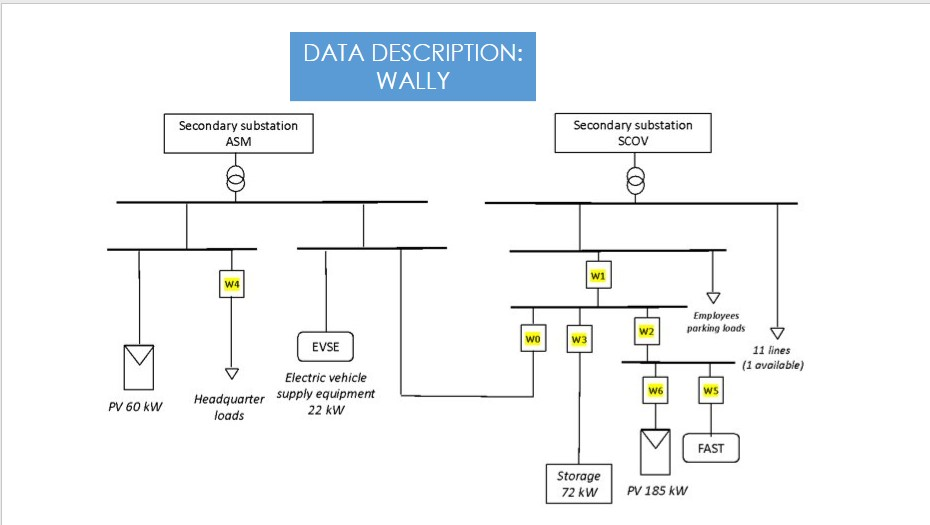

In [90]:
power_dt=pd.read_csv("power_dt.csv")
voltage_dt=pd.read_csv("voltage_dt.csv")
current_dt=pd.read_csv("current_dt.csv")

In [91]:
power_dt=power_dt.rename(columns={'Unnamed: 0':'index'}).set_index('index')
current_dt=current_dt.rename(columns={'Unnamed: 0':'index'}).set_index('index')
voltage_dt=voltage_dt.set_index('index')


In [92]:
weather = read_csv_and_set_index('weather.csv',col='date',date_parse = True, separator =';')

### Modifying the existing dfs

####Renaming the columns

We will make some changes in the names of the columns for each df, in order to be easier to understand every plot that we will create.

In [93]:
power_dt = power_dt.rename(columns={"active_w2":"Active Power of W2", "reactive_w2":"Reactive Power of W2","apparent_w2":"Apparent Power of W2",
                                    "active_w3":"Active Power of W3", "reactive_w3":"Reactive Power of W3","apparent_w3":"Apparent Power of W3",
                                    "active_w4":"Active Power of W4", "reactive_w4":"Reactive Power of W4","apparent_w4":"Apparent Power of W4",
                                    "active_w5":"Active Power of W5", "reactive_w5":"Reactive Power of W5","apparent_w5":"Apparent Power of W5",
                                    "active_w6":"Active Power of W6", "reactive_w6":"Reactive Power of W6", "apparent_w6":"Apparent Power of W6",})

In [74]:
current_dt = current_dt.rename(columns={"w6_phase1":"Phase I of W6","w6_phase2":"Phase II of W6","w6_phase3":"Phase III of W6",
                                        "w5_phase1":"Phase I of W5","w5_phase2":"Phase II of W5","w5_phase3":"Phase III of W5",
                                        "w4_phase1":"Phase I of W4","w4_phase2":"Phase II of W4","w4_phase3":"Phase III of W4",
                                        "w3_phase1":"Phase I of W3","w3_phase2":"Phase II of W3","w3_phase3":"Phase III of W3",
                                        "w2_phase1":"Phase I of W2","w2_phase2":"Phase II of W2","w2_phase3":"Phase III of W2",})

In [75]:
voltage_dt = voltage_dt.rename(columns={"w6_u1":"Phase I of W6 (V)","w6_u2":"Phase II of W6 (V)","w6_u3":"Phase III of W6 (V)",
                                     "w5_u1":"Phase I of W5 (V)","w5_u2":"Phase II of W5 (V)","w5_u3":"Phase III of W5 (V)",
                                     "w4_u1":"Phase I of W4 (V)","w4_u2":"Phase II of W4 (V)","w4_u3":"Phase III of W4 (V)",
                                     "w3_u1":"Phase I of W3 (V)","w3_u2":"Phase II of W3 (V)","w3_u3":"Phase III of W3 (V)",
                                     "w2_u1":"Phase I of W2 (V)","w2_u2":"Phase II of W2 (V)","w2_u3":"Phase III of W2 (V)"})

In [94]:
power_dt = power_dt.rename(columns={"month":"Month","year":"Year"})
current_dt = current_dt.rename(columns={"month":"Month","year":"Year"})
voltage_dt = voltage_dt.rename(columns={"month":"Month","year":"Year"})




In [95]:
power_dt = power_dt.rename(columns={"hour_of_day":"Hour of the day"})
voltage_dt = voltage_dt.rename(columns={"hour_of_day":"Hour of the day"})
current_dt = current_dt.rename(columns={"hour_of_day":"Hour of the day"})

In [96]:
power_dt = power_dt.rename(columns={"weekday_num":"Day of the week"})
current_dt = current_dt.rename(columns={"weekday_num":"Day of the week"})
voltage_dt = voltage_dt.rename(columns={"weekday_num":"Day of the week"})



####Changing timezone

As our data are in UTC we will change them to local time in Italy, Terni, as we want to do time based calculations and detect daily patterns it is preffered to work in local time. We will use the function change_timezone, which will by default convert the current timezone to Italy/Rome's timezone and return the df with a datetime index.

In [97]:
weather = change_timezone(weather)
power_dt = change_timezone(power_dt)
current_dt = change_timezone(current_dt)
voltage_dt = change_timezone(voltage_dt)

Now that the datetime index has changed, we should update the datetime columns, which still contain the datetime data of the previous index.

In [98]:
power_dt['day_of_month']=power_dt.index.day
power_dt['Month']=power_dt.index.month
power_dt['Hour of the day']=power_dt.index.hour
power_dt['Year']=power_dt.index.year
power_dt['weekday']=power_dt.index.day_name()
power_dt['Day of the week']=power_dt.index.weekday



In [ ]:
current_dt['day_of_month']=current_dt.index.day
current_dt['Month']=current_dt.index.month
current_dt['Hour of the day']=current_dt.index.hour
current_dt['Year']=current_dt.index.year
current_dt['weekday']=current_dt.index.day_name()
current_dt['Day of the week']=current_dt.index.weekday



In [ ]:
voltage_dt['day_of_month']=voltage_dt.index.day
voltage_dt['Month']=voltage_dt.index.month
voltage_dt['Hour of the day']=voltage_dt.index.hour
voltage_dt['Year']=voltage_dt.index.year
voltage_dt['weekday']=voltage_dt.index.day_name()
voltage_dt['Day of the week']=voltage_dt.index.weekday



#### Resampling dataframe

 We create a resampled dataframe for power data which will have the same frequency with the weather data, in order for us to be able to make better plots with these dfs. Also with the timezone change dates have been lost. These dates represent the times when Italy springs forward (turn clocks ahead and lose an hour) on Sun, Mar 27, 2022 2:00 AM, and falls back (turn clocks back and gain an hour) on Sun, Oct 30, 2022 3:00 AM. By resampling the df these dates are created and filled with NaNs.

In [99]:
power_resampled = power_dt.resample('H').mean()


In [100]:
weather = weather.resample('H').mean()

In [103]:
specific_datetime = pd.to_datetime('2022-12-31 23:00')
power_resampled = power_resampled[power_resampled.index <= specific_datetime]
weather=weather.loc[power_resampled.index]


We will use simple interpolation to fill these lost dates for the weather data, as the change from the previous and next filled date, will not be significant from the one that is missing.

In [50]:
weather = weather['2022-03-27 01:00:00':'2022-03-27 05:00:00'].interpolate()

In [51]:
weather = weather['2022-10-30 01:00:00':'2022-10-30 05:00:00'].interpolate()

In [ ]:
power_dt.to_csv("power_dt.csv")

voltage_dt.to_csv("voltage_dt.csv")

current_dt.to_csv("current_dt.csv")

weaather.to_csv("weather.csv")


In [ ]:
### Checking the distribution of NaN values across the dataframes of power, current and voltage

### Dealing with missing values

#### Percentage of NaNs per meter

To get a first overview of the missing values /variable/ meter we use the nan_percentage function. The percentage of missing values for every meter's component is as follows:

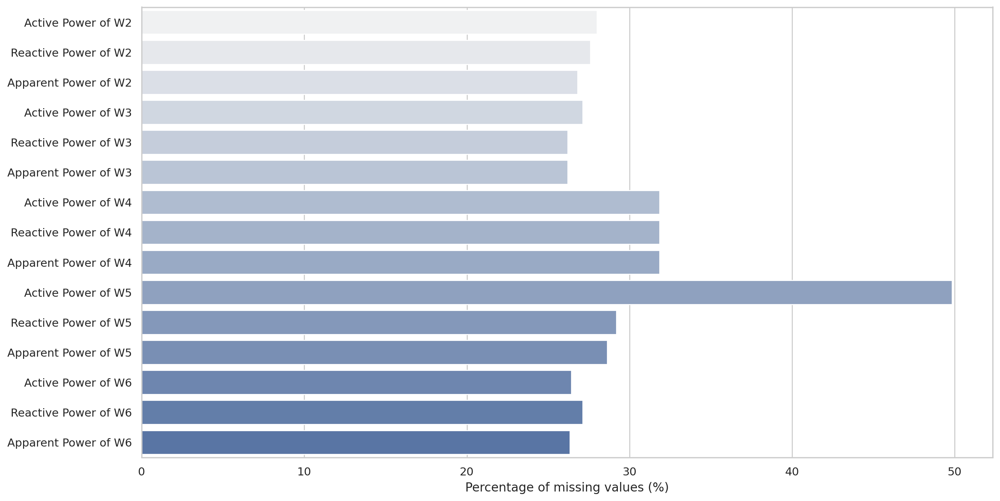

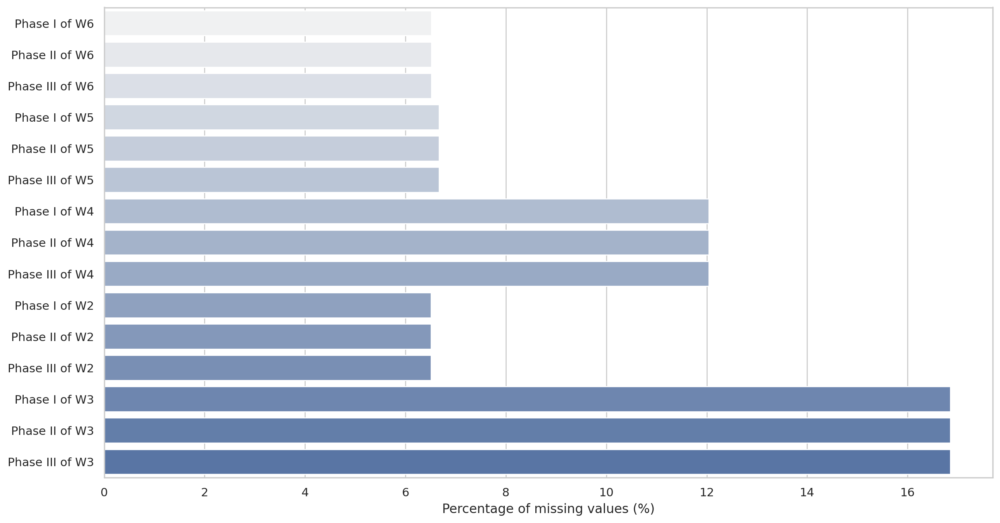

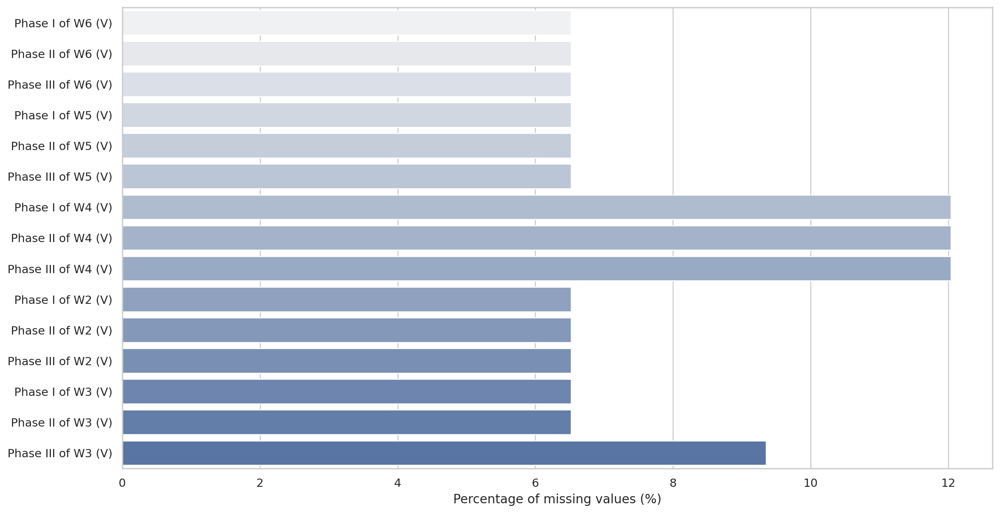

In [99]:
nan_percentage(power_dt)
nan_percentage(current_dt)
nan_percentage(voltage_dt)

As we can see from the above barplots the meter with the highest percentage of Nan values for current is W3 with 17% of its values missing and for voltage data is w4, with approximately 12% of its values missing, while for power data the 50% approximately of w5's active power is missing, followed by 31% of w4's power missing.


The percentages are very high. We now have to see how these values are distributed

Note: W5 corresponds to the smart meter connected to the fast charging station
W4 corresponds to the smart meter connected to the headquarters loads


#### Missing values per datetime attributes (month, day, etc)

In order to better understand how these missing values are distributed we call the do the following.

By calling the missing_df function on our dfs, we get the relevant "missing" dataframes that have a True value if the corresponding value of the initial df is NaN and False otherwise.


In [ ]:
missing_power =missing_df(power_dt)
missing_current=missing_df(current_dt)
missing_voltage= missing_df(voltage_dt)

We create barplots to see the distribution of NaN values across the different datetime attributes. We get four barplots for each meter's component:  % Nan / month, 2) %NaN /year, 3)%NaN /the hour of the day, 4)%NaN / weekday

##### For power data

In [ ]:
nan_distribution(missing_power)

From the above barplots for missing data for power, we understand that :

*  Missing values are almost equally distributed among the hours of the day and the weekdays

*   For 2021 measurements, we miss July entirely and approximately 20% of August

*   For 2022 measurements,
    1) we miss 90-100% of July and August, and 20% of October for all meters
    2) for the connected to headquarter loads meter (w4) we miss almost all of May's measurements and about 20% of April's
    3) for the connected to the fast charging station smart meter ( w5) from September to December we miss 100% of its active power's data and about 10-20 % of its apparent and reactive.

*   For 2023 measurements,for January we miss 100% of w5's active power and about 20% of its apparent and reactive power. Also approximately 10 % of w2's active and reactive power is missing. For the rest of 2023 the meters seem to have stopped measuring.

So the mass percentage of the missing values comes from the summer months for both 2021 and 2022.
Regarding the meter at the headquarter loads something caused the meter not to measure from April to May 2022.
Regarding W5 meter it looks like it has stopped measuring the active power since July 2022.

##### For current data

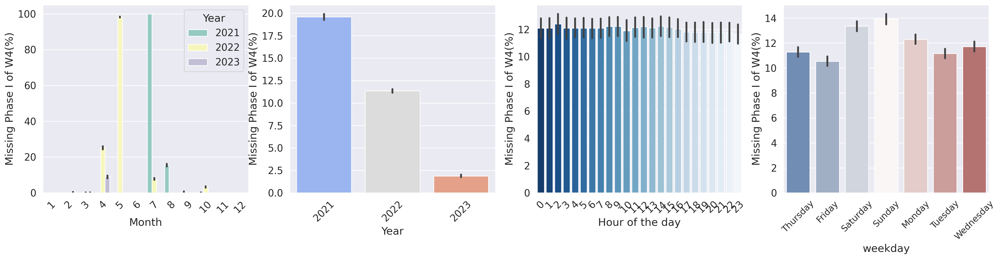

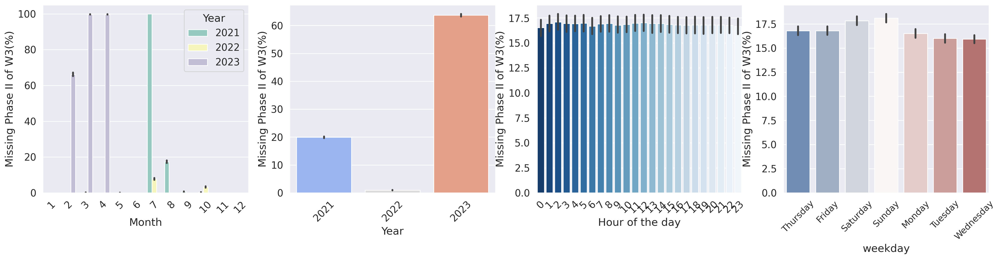

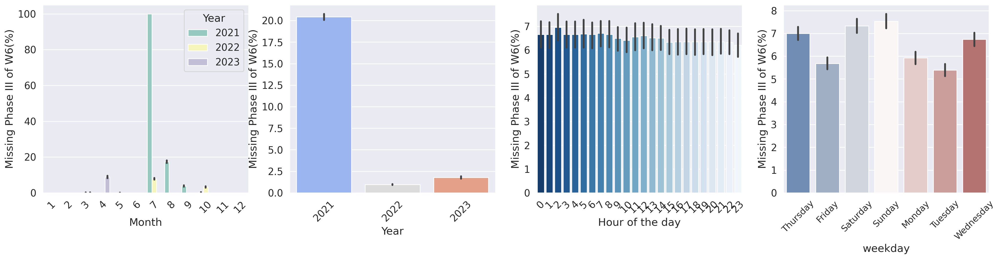

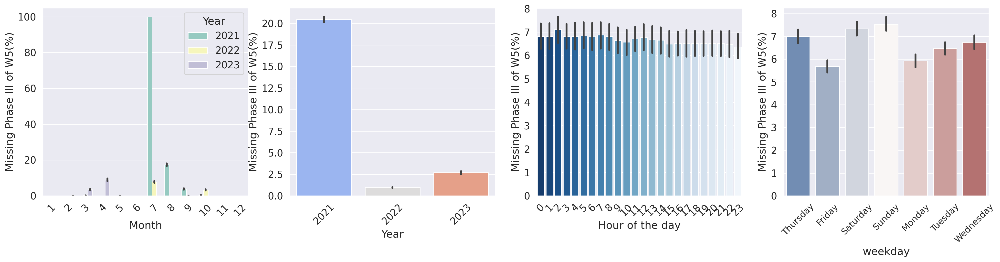

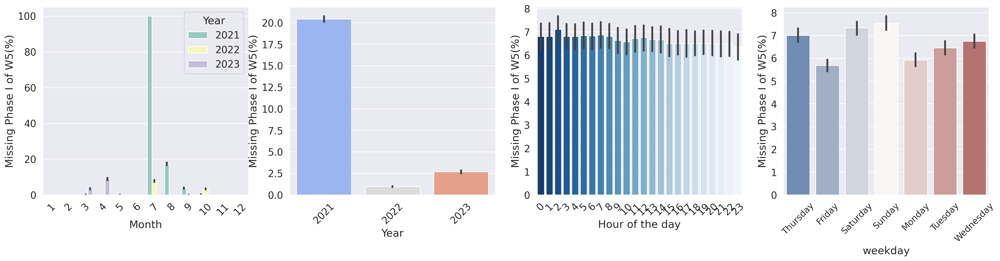

...

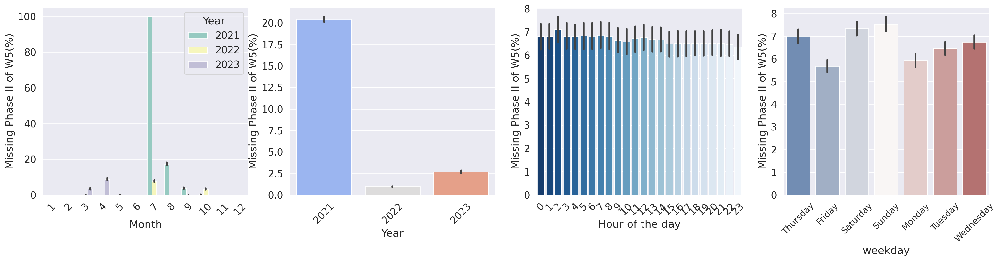

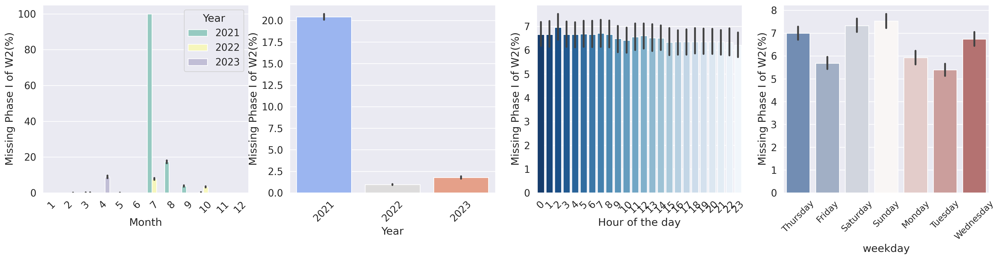

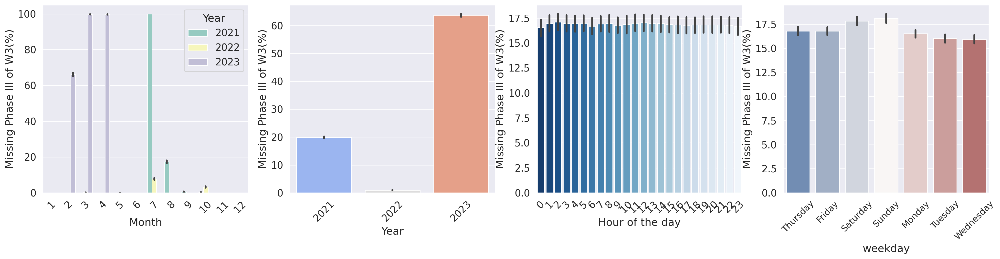

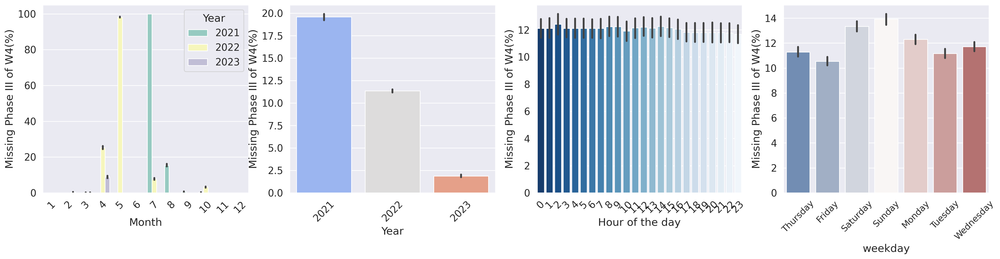

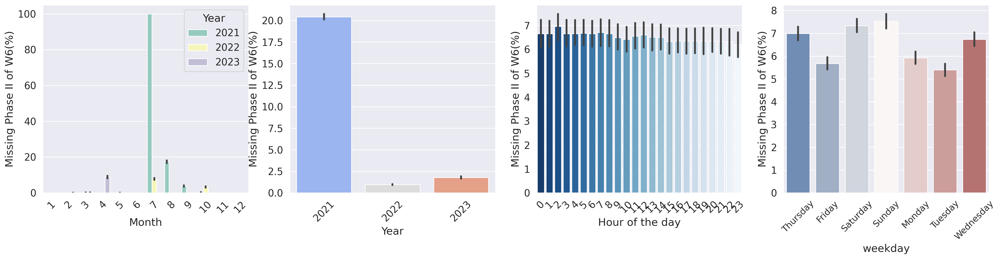

In [102]:
nan_distribution(missing_current)

For current data, from the above barplots, we realize that the majority of missing values comes from 2021. Specifically:

*  For 2021, 100% of July's and 20% of August's data is missing
*  For 2022, 100% of W4's data for May and 25% of April is missing, while about 8% of July's data is missing for all the meters.
* For 2023, a lot of values of the smart meter connected to the battery (W3)are missing
* Lastly, we see a slightly increased percentage of missing values during the weekends.




##### For Voltage Data


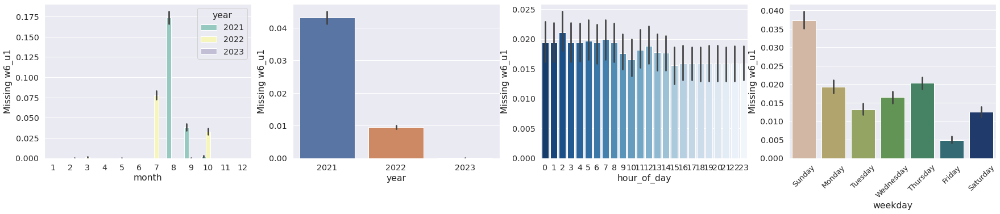

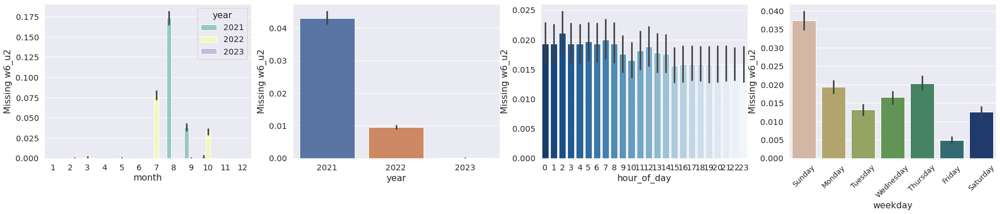

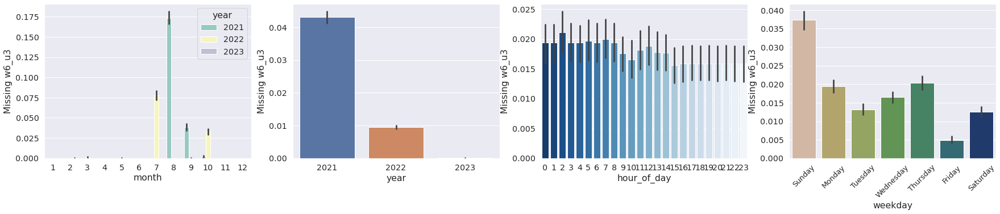

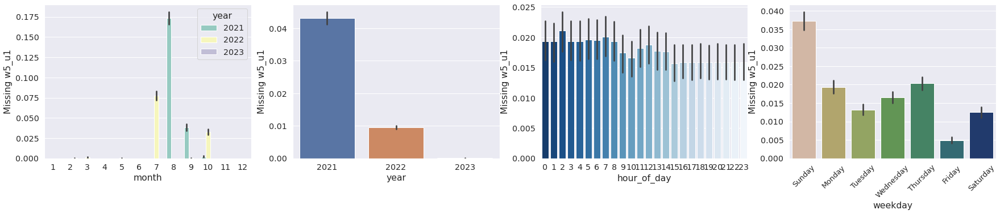

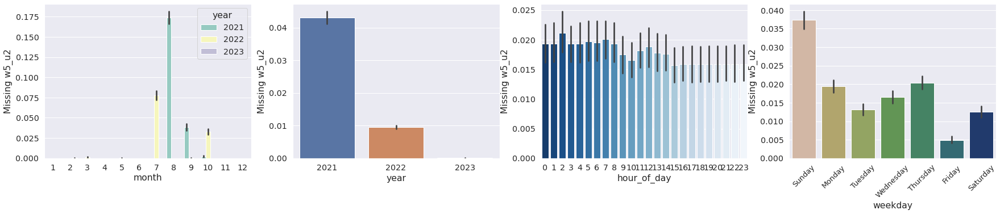

...

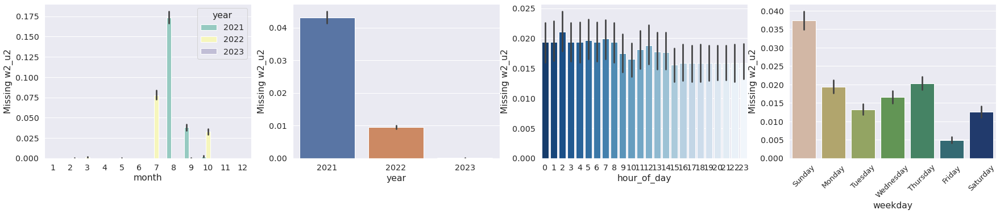

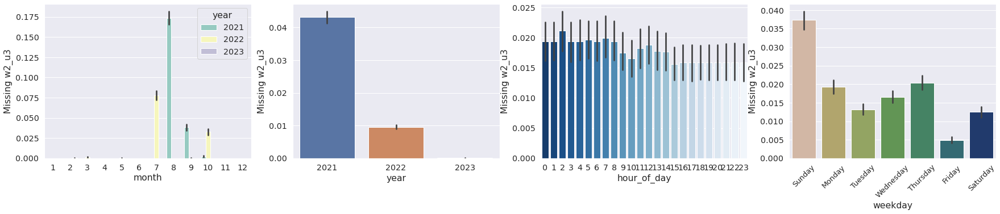

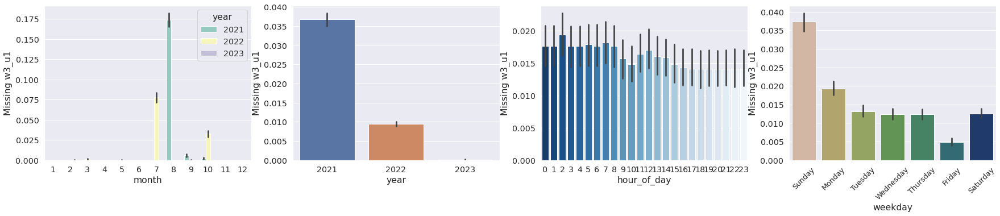

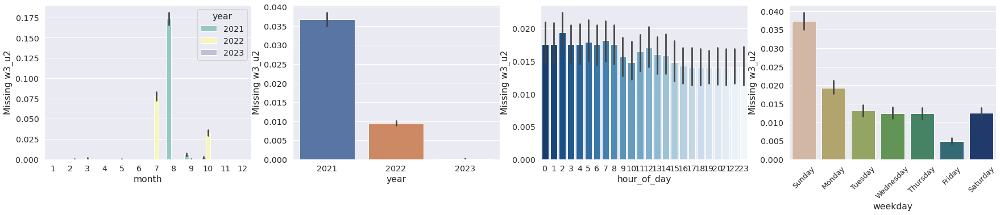

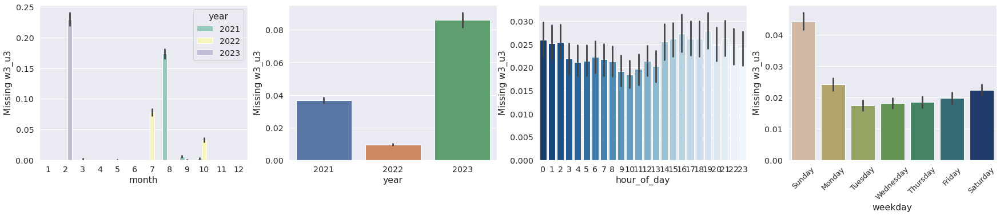

In [ ]:
nan_distribution(missing_voltage)

We see that the missing values are distributed in a similar way as the current data

##### Conclusions

From the above barplots for Nan values we have a good understanding of how nan values are distributed. As we realized there is a large number of consecutive NaN values, as whole months are missing. For these values we can't do anything, as filling them would result to much randomnes.
For the other values we will try an imputation technique.


#### Imputation

Creating a list with the recorded holidays of Terni, Italy as this is needed for the functions which we will use later

In [103]:
holidays_list = holidays.country_holidays('IT', subdiv='TR')

We select to imputate the missing values by using the custom "impute" function. This function is basically a combination of two techniques, linear interpolation and imputation based on historical values.

In [ ]:
power_imputed = impute(power_dt, holidays_list)

In [106]:
power_dt.isna().sum().sum()

847231

In [107]:
power_imputed.isna().sum().sum()

827868

In [ ]:
current_imputed = impute(current_dt, holidays_list)

In [ ]:
voltage_imputed = impute(voltage_dt, holidays_list)

### Outliers Removal

For the outliers (the values that are vary a lot from their nearby values) removal, the mean and the standard deviation per month is calculated and the datapoints that were more than 10* std_deviation apart from their month's mean value, were replaced by NaNs.

MIN 0.0


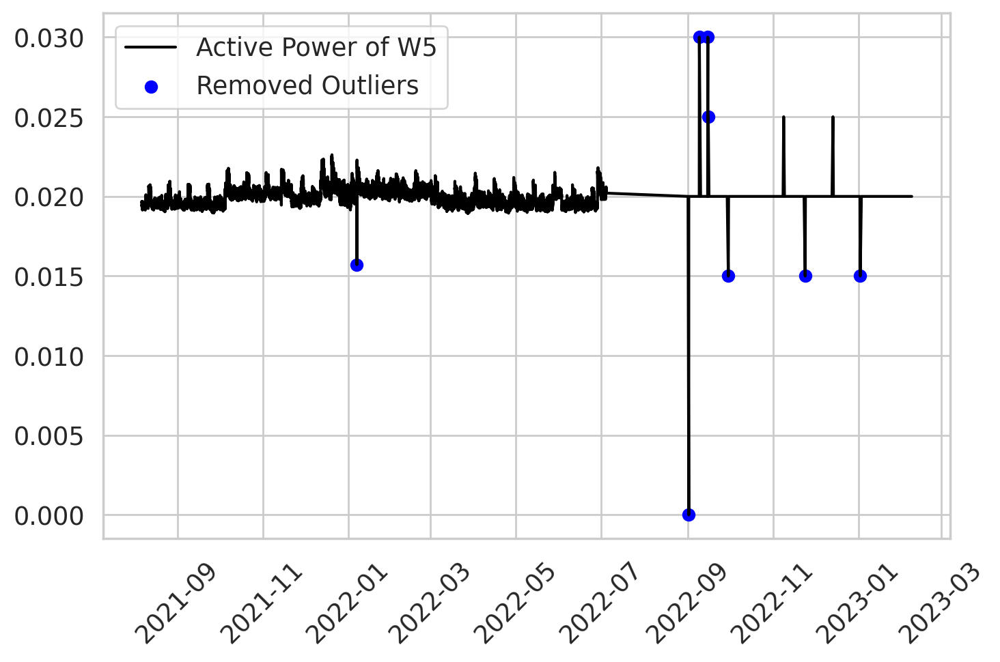

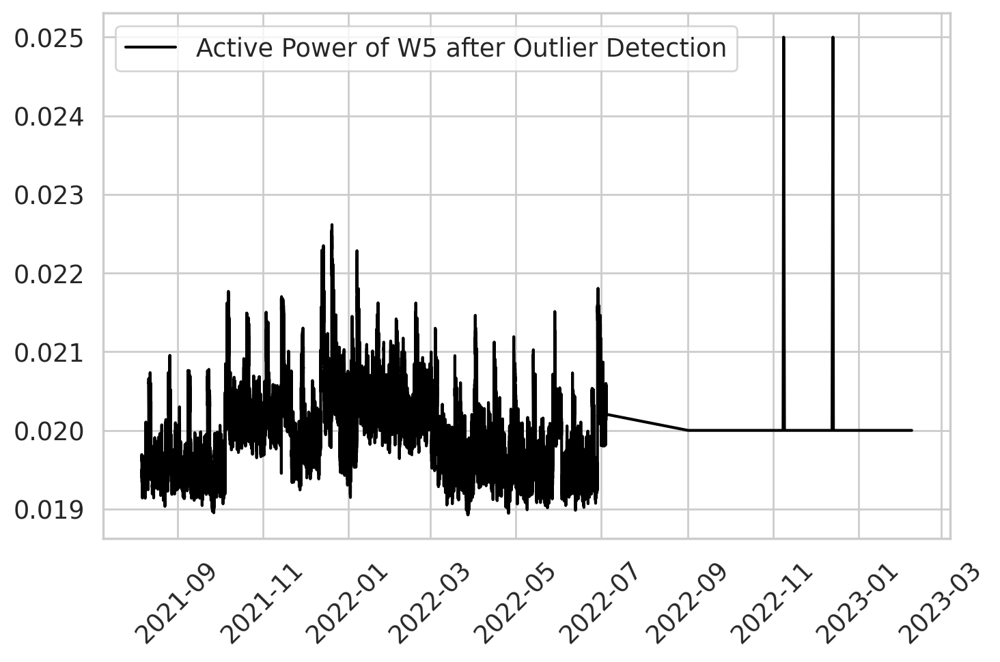

In [ ]:
x,a = remove_outliers(power_dt,col='Active Power of W5')


### Data Analysis


After dealing with Nans and outliers we will analyze our data.

#### Summary of data


To get a clearer image of our data we use the .describe() function, to see some statistical aspects of the data.

In [357]:
# Define custom color mapping
cmap = sns.color_palette("YlGn", as_cmap=True)
colors = cmap(np.linspace(0, 1, 100))
colors[0] = (0.85, 0.85, 0.85, 0.85)  # Set a lighter color for the count row

summary = power_dt[['Active Power of W3','Reactive Power of W3','Apparent Power of W3','Active Power of W5','Reactive Power of W5','Apparent Power of W5']].describe()
styled_summary = summary.style.background_gradient(cmap=cmap, subset=pd.IndexSlice[['count'], :])
styled_summary



,Active Power of W3,Reactive Power of W3,Apparent Power of W3,Active Power of W5,Reactive Power of W5,Apparent Power of W5
count,138716.000000,140487.000000,140488.000000,95454.000000,134781.000000,135828.000000
mean,0.902375,4.010775,4.144719,0.019968,-0.916354,0.933004
std,0.016467,0.075342,0.075045,0.000547,0.011814,0.013958
min,0.815568,3.572744,3.712278,0.000000,-0.967817,0.733695
25%,0.890498,3.959280,4.093248,0.019522,-0.924955,0.924597
50%,0.903129,4.010658,4.144496,0.019905,-0.915500,0.933040
75%,0.914865,4.062529,4.196189,0.020303,-0.907778,0.941428
max,1.056667,4.329491,4.463091,0.030000,-0.806604,1.104646


In [355]:
# Define custom color mapping
cmap = sns.color_palette("YlGn", as_cmap=True)
colors = cmap(np.linspace(0, 1, 100))
colors[0] = (0.85, 0.85, 0.85, 0.85)  # Set a lighter color for the count row

summary = power_dt[['Active Power of W4','Reactive Power of W4','Apparent Power of W4','Active Power of W6','Reactive Power of W6','Apparent Power of W6','Active Power of W2','Reactive Power of W2','Apparent Power of W2']].describe()
styled_summary = summary.style.background_gradient(cmap=cmap, subset=pd.IndexSlice[['count'], :])
styled_summary



,Active Power of W4,Reactive Power of W4,Apparent Power of W4,Active Power of W6,Reactive Power of W6,Apparent Power of W6,Active Power of W2,Reactive Power of W2,Apparent Power of W2
count,129706.000000,129705.000000,129706.000000,140040.000000,138714.000000,140212.000000,137059.000000,137837.000000,139331.000000
mean,56.935606,-2.346907,58.987475,-21.364824,14.691302,27.987838,-21.895014,12.864545,28.316928
std,22.228859,10.860479,21.380883,37.339100,18.315300,40.738522,38.522041,17.017614,40.347044
min,-24.164224,-17.673406,0.000000,-192.649814,-0.092388,0.547251,-195.630865,-1.363166,1.061034
25%,43.368109,-9.739494,45.070357,-28.827266,-0.048556,0.592489,-31.143411,-1.125121,1.535630
50%,53.800019,-6.579050,55.148649,0.042595,0.004958,0.610076,0.856187,-1.065000,2.255000
75%,68.863822,0.564067,70.075270,0.045000,25.240951,39.437437,0.865454,23.119137,39.079225
max,161.608690,48.147457,166.341750,4.656833,83.177921,210.213884,14.330000,75.789100,210.148292


From these, we notice that the power of W3 and W5 is almost zero. That leads us to the conclusion that the storage and the fast charging station were barely operating.
Moreover, we notice that the majority and the peak values of W4 and W6 are positive and negative respectively. Although there are some values of the opposite sign. We are going to further explore these values.

#### Barplots for W4 opposite sign


We are going to plot the values of W4 that are negative in respect to the hour of the day.

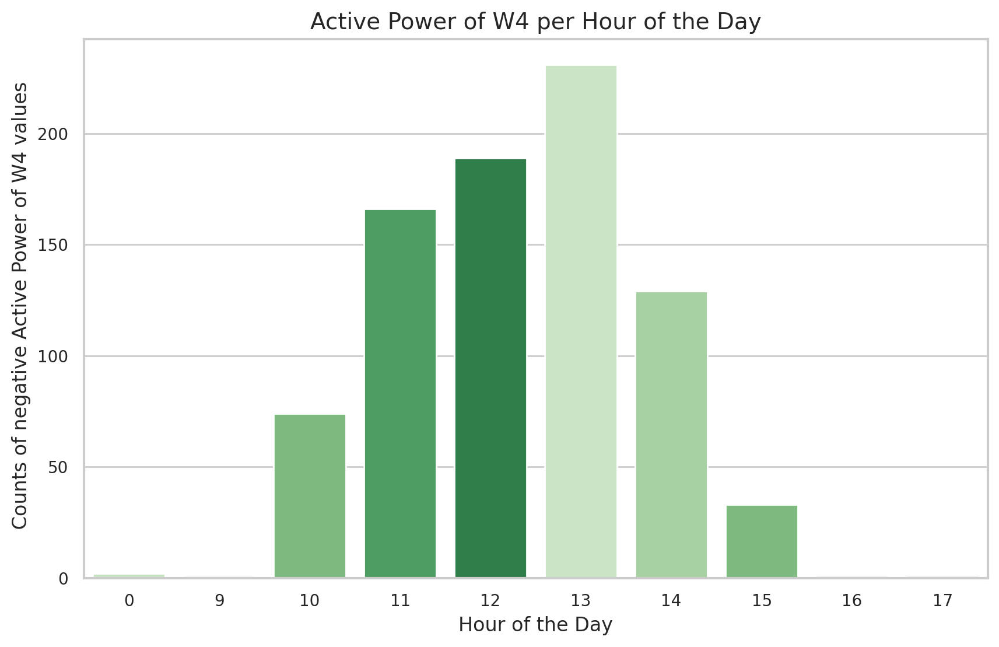

In [401]:
plot_with_value_counts(power_dt,'Active Power of W4',sort ='negative')

As we see, the negative values measured by W4 occur mainly between 10:00 and 15:00, hours when the PV is highly efficient. These values may be explained as the the times that the pv is generating more power than the headquarter's load consumes, resulting in power returning back to the grid.

Moreover we are going to see how many these values, by using the custom function "barplot_of_positiveAndNegative" which creats a barplot of the positive values count  and the negative.

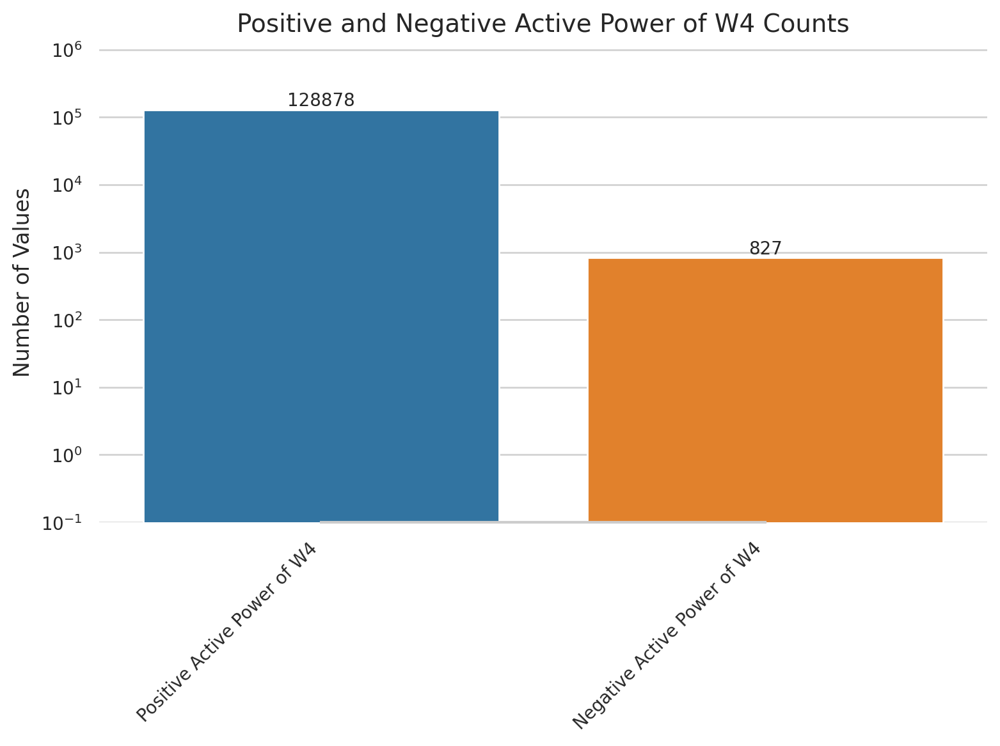

In [ ]:
barplot_of_positiveAndNegative(power_dt,'Active Power of W4')

From the above barplot we understand that the negative values occur in less than 0.65% of the data

#### Barplots for W6's positive values

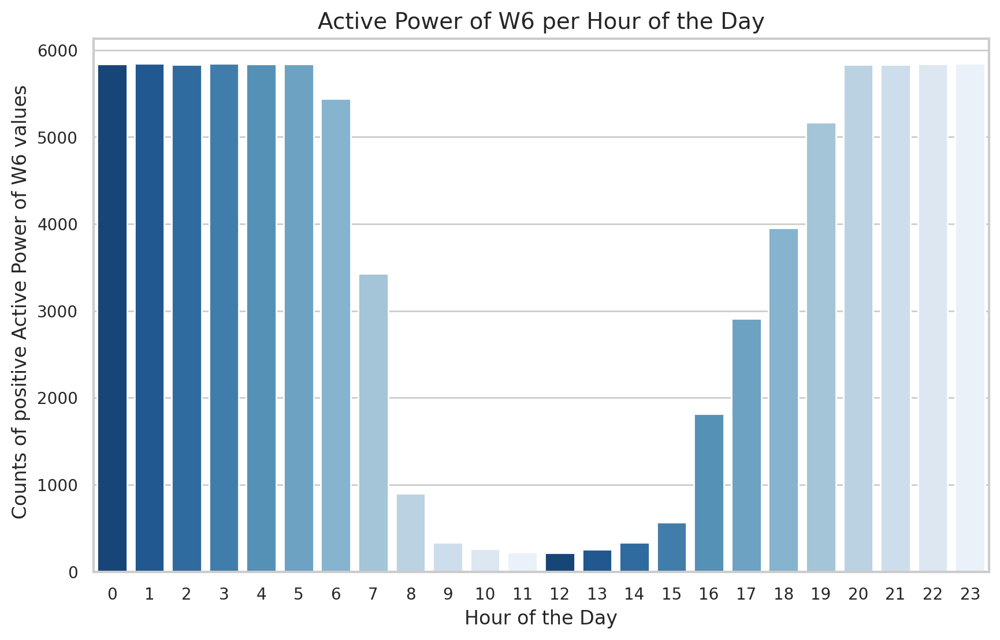

In [402]:
plot_with_value_counts(power_dt,'Active Power of W6','positive')

As we see the positive values mainly occur between 17:00 and 07:00, when the PV is barely or not operating at all. As the PV's inverters and generators need a little amount of active power in order to operate, these values are probably due to this power that the pv consumes.

#### Plotting raw data

To get a better look in our data we will plot three days of the data for each df

##### Power Data


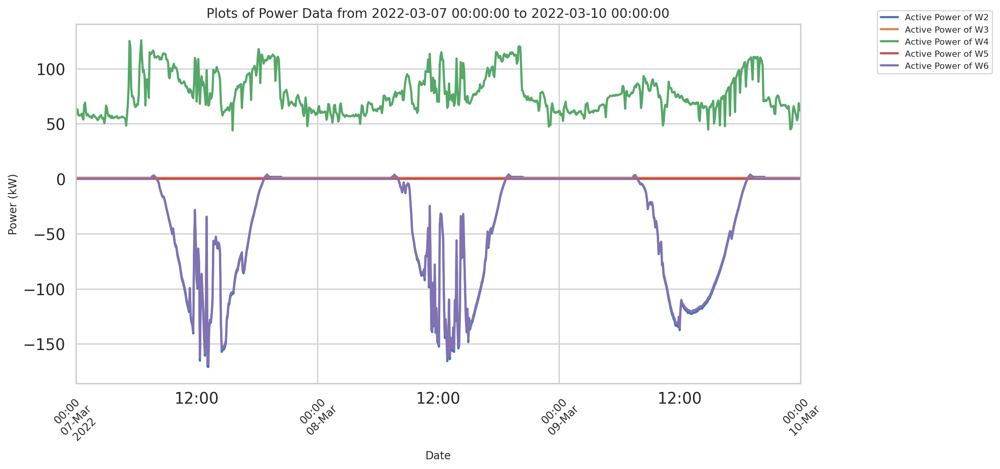

In [ ]:
create_power_plots(power_dt,'2022-03-07 00:00:00','2022-03-10 00:00:00','kW')

The battery and the fast charging station don't seem  to properly work as their active power values are almost zero. MMoreover, we see that the power measured by W2 and the power measured by W6(pv's power) are almost the same. This can be justified as from the topology of the grid we understand that W2P = W5P +W6P → W2P = W6P, where ( WiP, the active power of the i meter)

##### Voltage data


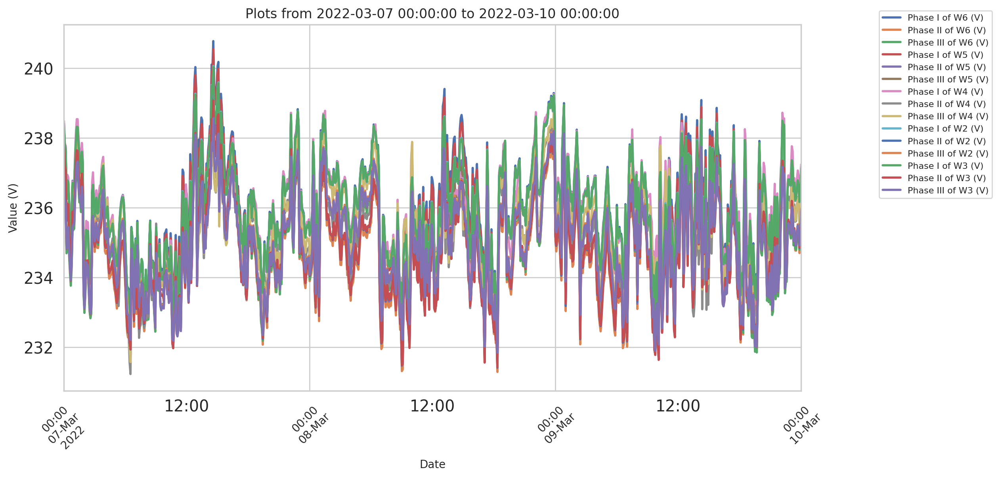

In [ ]:
create_plots(voltage_dt,'2022-03-07 00:00:00','2022-03-10 00:00:00','V')

All of the voltage data vary from 230 V to 240 V

##### Current Data


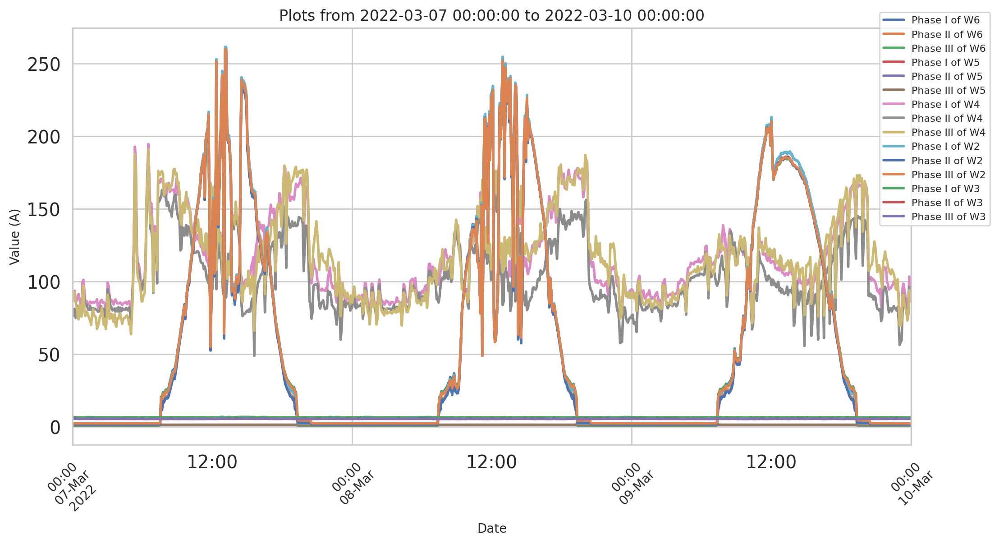

In [ ]:
create_plots(current_dt,'2022-03-07 00:00:00','2022-03-10 00:00:00','A')

We see that the current of the fast charging station and the battery is almost zero. (w3 and w5)
The current of W2 is almost the same with the current of the pv (w6)


#### Overlapping Lineplots

We decided to create diagrams to see how the mean value per hour of the day has changed for the year 2021, 2022 and 2023. These diagrams are shown below

In [3]:
annual_lineplots(power_dt,'Active Power of W4','kW')

NameError: ignored

 We notice an increased consumption for the headquarter loads at 2023 and a decreased power generation for the PV(w6). These results were anticipated as for 2023 we only have two months of data, January and February, months where the solar radiation is decreased and the low temperatures lead to an increased power demand.

In [ ]:
import numpy as np

# Creating vectors X and Y
x = np.linspace(0, 200)
y = np.e**(-0.025*x)

fig = plt.figure(figsize = (10, 5))
# Create the plot
plt.plot(x, y)
plt.xlabel("Distance from the nearest non NaN value")
plt.ylabel("Weight w of linear interpolation")

# Show the plot
plt.show()

#### Calculation of Power Factor

We are going to create a new column for each meter that it will contain the power factor of each meter. As pf = Active Power / Apparent Power, we are going to divide the relevant columns for each meter and creating a copy of our power df with the added column


In [52]:
power = power_imputed.copy()

In [53]:
power['Power Factor of W2'] = power['Active Power of W2']/abs(power['Apparent Power of W2'])
power['Power Factor of W3'] = power['Active Power of W3']/abs(power['Apparent Power of W3'])
power['Power Factor of W4'] = power['Active Power of W4']/abs(power['Apparent Power of W4'])
power['Power Factor of W5'] = power['Active Power of W5']/abs(power['Apparent Power of W5'])
power['Power Factor of W6'] = power['Active Power of W6']/abs(power['Apparent Power of W6'])

##### Plotting the power factor of each meter

###### For the Photovoltaic (w6)


For the meter connected to the PV, we expect the power factor to vary from a high to almost zero value, with a period of one day, as during the day the pv generates power while the night it doesn't.

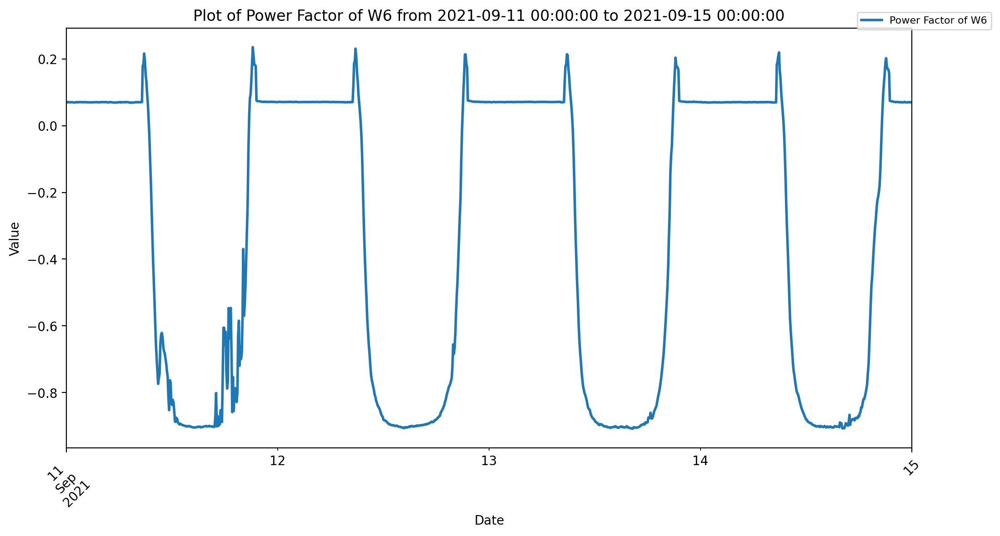

In [54]:
create_plots(power,'2021-09-11 00:00:00','2021-09-15 00:00:00',column ='Power Factor of W6', unit_of_msrmnt = "none")


By using the built-in function .describe() we are going to check the statistical description of W6's power factor.

In [55]:
power['Power Factor of W6'].describe()

count    140040.000000
mean         -0.225878
std           0.415221
min          -0.916447
25%          -0.728540
50%           0.071790
75%           0.075328
max           1.314395
Name: Power Factor of W6, dtype: float64

As we see the max value of the pf is larger than one, which is practically impossible. We are going to check this

In [61]:
power[power['Power Factor of W6']>1]

,Active Power of W2,Reactive Power of W2,Apparent Power of W2,Active Power of W3,Reactive Power of W3,Apparent Power of W3,Active Power of W4,Reactive Power of W4,Apparent Power of W4,Active Power of W5,...,Month,Hour of the day,Year,weekday,Day of the week,Power Factor of W2,Power Factor of W3,Power Factor of W4,Power Factor of W5,Power Factor of W6
index,,,,,,,,,,,,,,,,,,,,,
2022-12-04 08:25:00,0.242418,-1.035135,1.139434,0.895000,4.060678,4.196341,56.214549,-7.042614,57.145855,NaN,...,12,8,2022,Sunday,6,0.212753,0.213281,0.983703,NaN,1.314395
2023-01-17 09:05:00,0.215000,-1.023333,1.106667,0.895094,3.949540,4.083104,113.811745,12.728613,114.893670,NaN,...,1,9,2023,Tuesday,1,0.194277,0.219219,0.990583,NaN,1.113858


These two values appear obviously due to measuring errors and so they will be replaced by NaNs.

In [68]:
power.at['2022-12-04 08:25:00', 'Power Factor of W6'] = pd.NA

power.at['2023-01-17 09:05:00', 'Power Factor of W6'] = pd.NA

For the rest of the positive values we will create some barplots to see when these are occuring

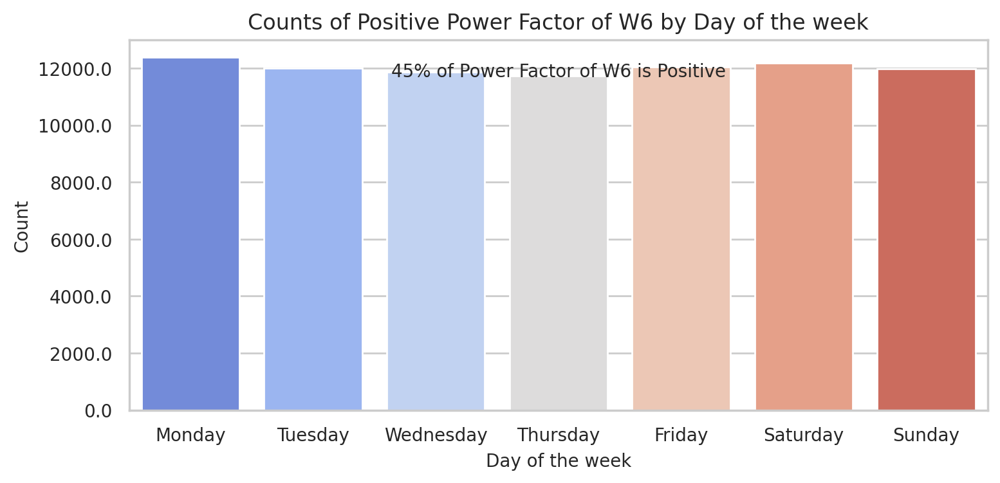

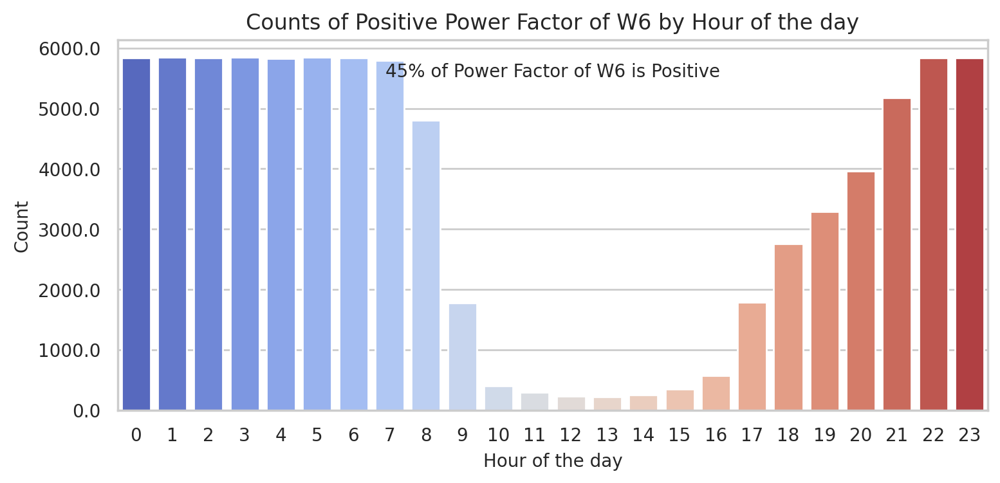

In [70]:
create_countplots_per_day_and_hour(power,'Power Factor of W6','Positive')

It is noticed that the positive values of W6's pf occur during the time that is barely, or not operating at all. As explained earlier, during this time, the photovoltaic is consuming a little active power in order for its components to properly work. So we have positive active and positive apparent power measured from W6, leading to an positive power factor.

###### For the headquarter loads

For the meter connected to the headquarter loads we expect a high positive power factor, ideally one, as there the losses should be eliminated.

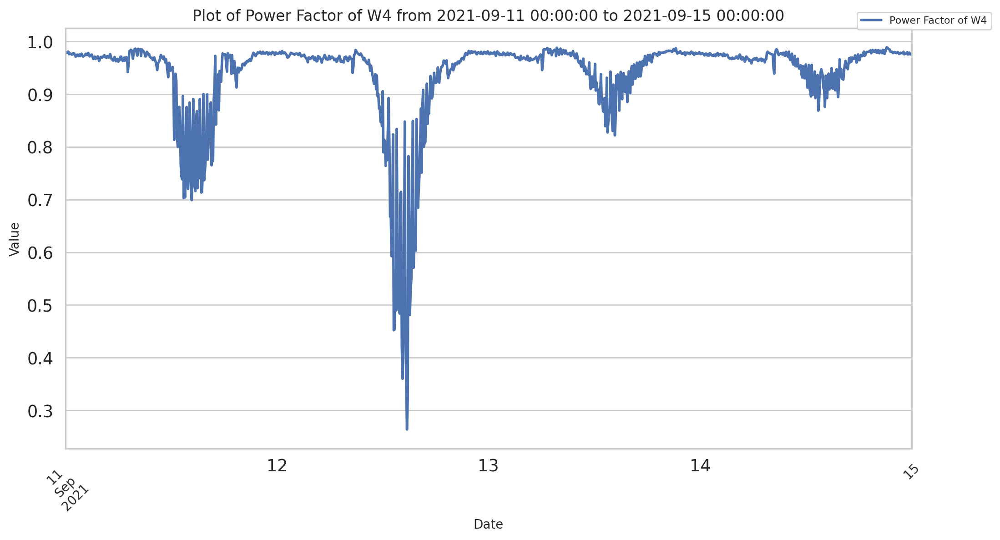

In [412]:
create_plots(power,'2021-09-11 00:00:00','2021-09-15 00:00:00','','Power Factor of W4')


We are going to check the statistical description of the power factor of W4

In [ ]:
power['Power Factor of W4'].describe()

count    129705.000000
mean          0.945368
std           0.138081
min          -0.865840
25%           0.957187
50%           0.974152
75%           0.984152
max           0.997234
Name: Power Factor of W4, dtype: float64

As we notice, the min value is negative, so we are going to check when these negative values occur and how many they are

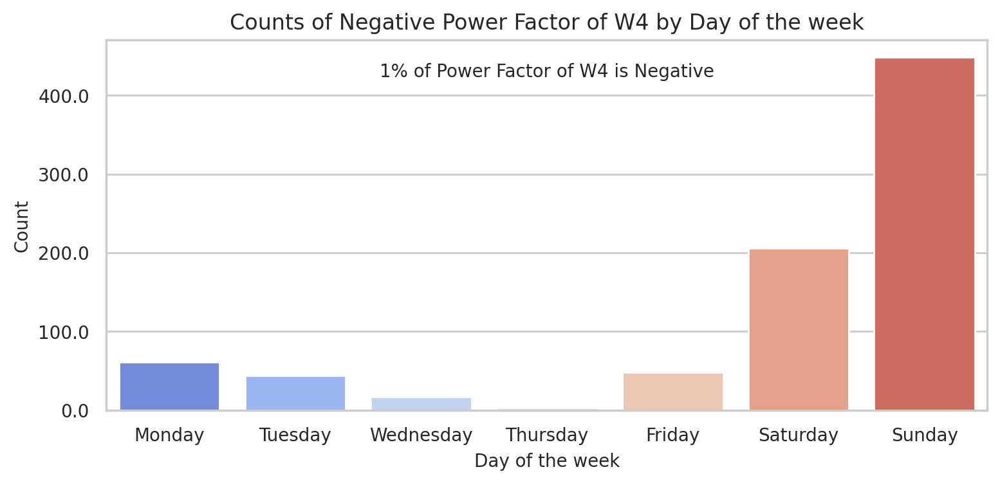

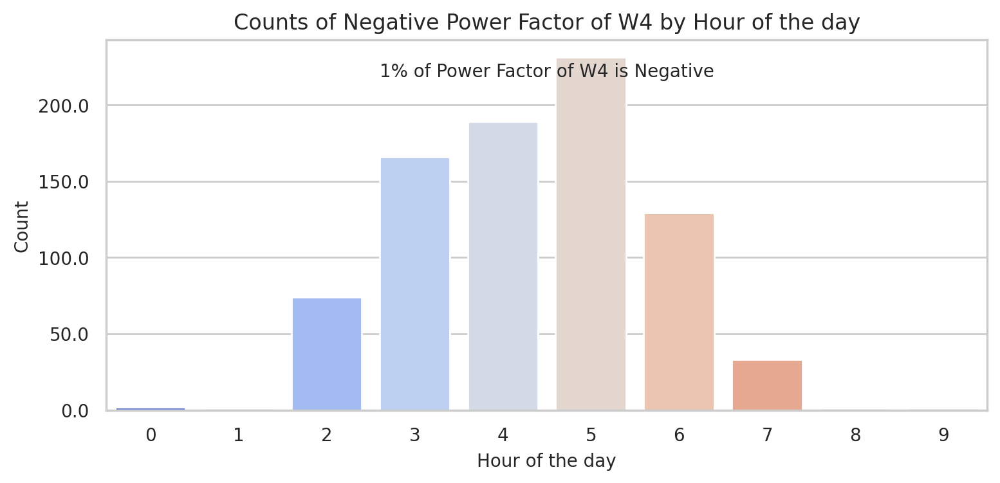

In [418]:
create_countplots_per_day_and_hour(power,'Power Factor of W4','Negative')

From the above countplots we realize that the majority of the negative power factor values occur during the weekend and mostly during the late night - early morning time. These negative values could be due to measuring errors

### Correlations

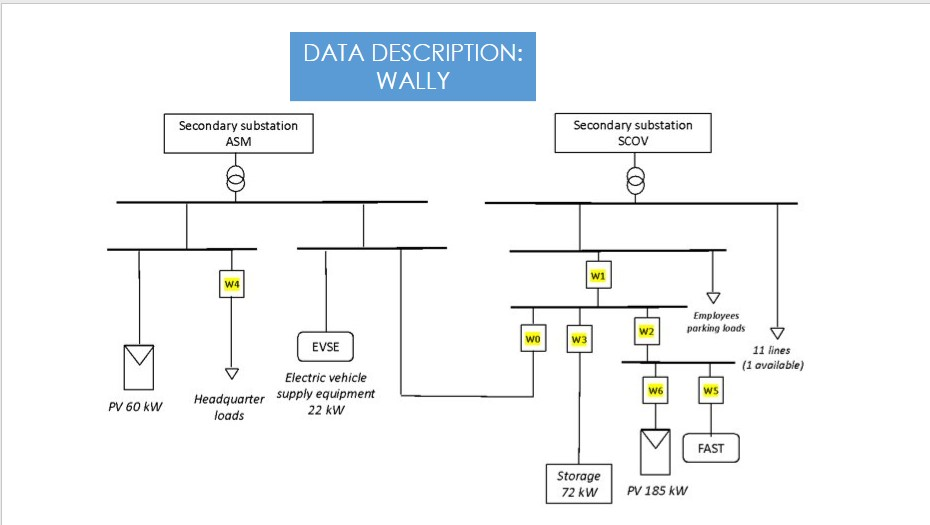

At first we are going to explore separately the power, current and voltage data and then alltogether, searching for correlations between the different components of each meter

Creating a correlation matrix for each dataframe ( power/current/voltage) to see which variables are negative or positive correlated.

#### Correlations between power Data

In [75]:
power_2 = power_dt.drop(columns={'day_of_month','Month','Hour of the day','Year','Day of the week'})

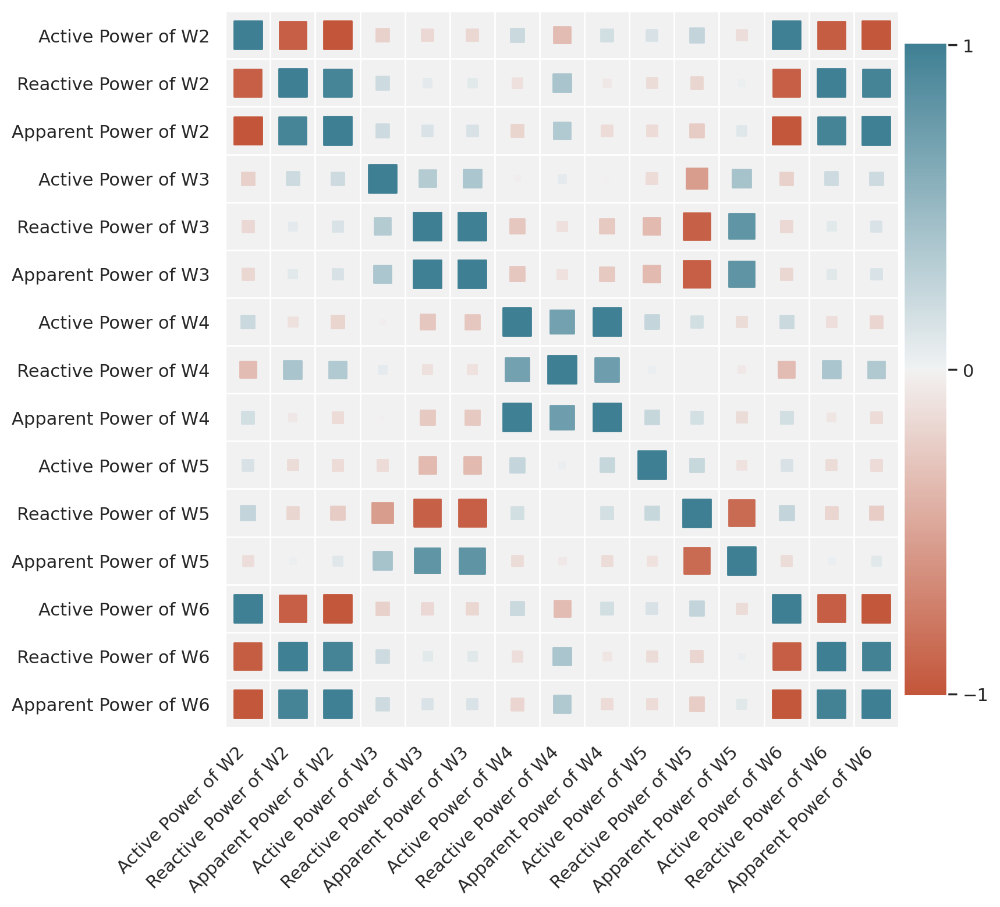

In [82]:
create_heatmap(power_dt)

From the above matrix we see that:

1. There is strong correlation between the power of the meter at the PV (W6) and the W2 meter. As wee see from the data description W2=W5+W6 and from the earlier analysis we found that the fast charging station which is connected to W5 meter is barely working, as its active and reactive power is almost zero. So their strong correlation was anticipated.
2. The reactive power of W5 meter is negative corrrelated to battery's reactive and apparent power (W3)
3. There is a strong negative correlation between active power of W2 and reactive power of W2, as well as the active power of w6 and the reactive power of w6.
4. Lastly, there is a strong positive correlation between the reactive and the apparent power of W3, and strong negative correlation between the reactive power and the apparent power of W5.




#### Exploring correlations with the weather data

Since the photovoltaic's performance but also the energy demand, hence the power values measured at the headquarter loads, depend on the weather conditions, it is only logical to explore the correlations between those variables too.


We are going to check the correlation between weather data and power of W6 and W4. (since w3 and w5 are not working, and w2 behaves as w6)

##### For W6

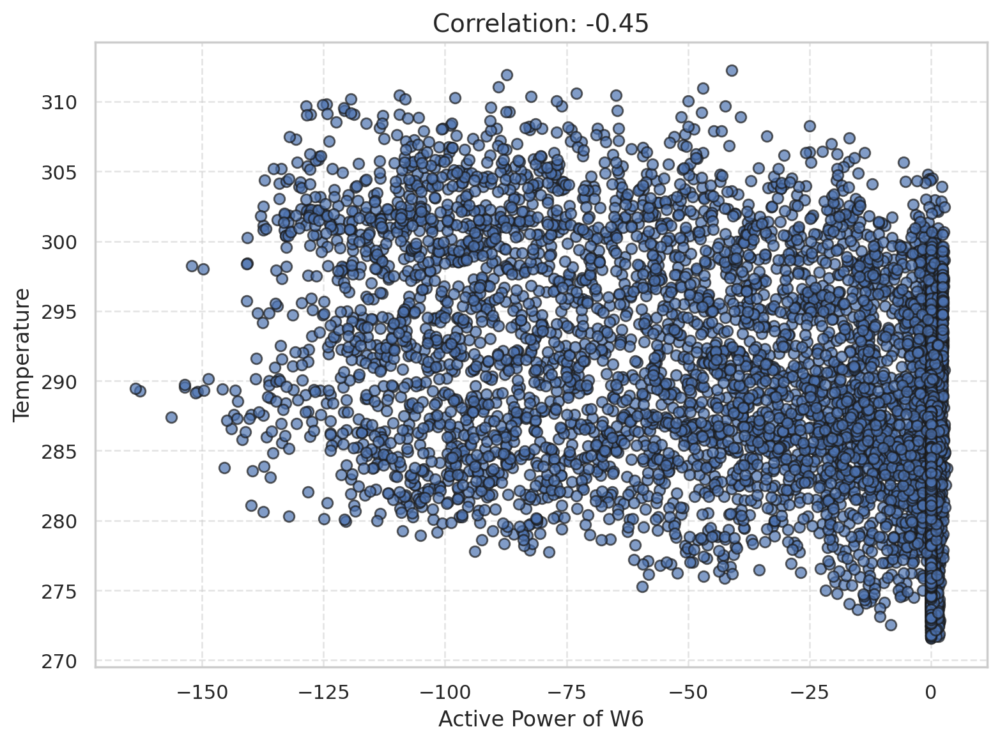

In [106]:
create_corr_plot(power_resampled, 'Active Power of W6',weather,'Temperature')

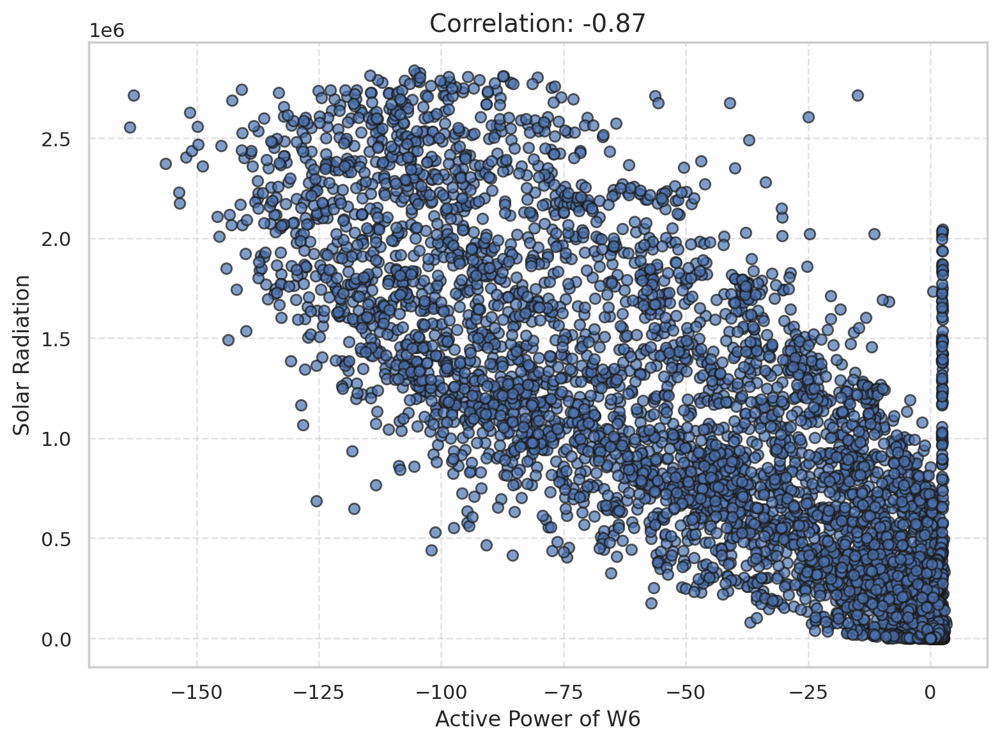

In [107]:
create_corr_plot(power_resampled, 'Active Power of W6',weather,'Solar Radiation')

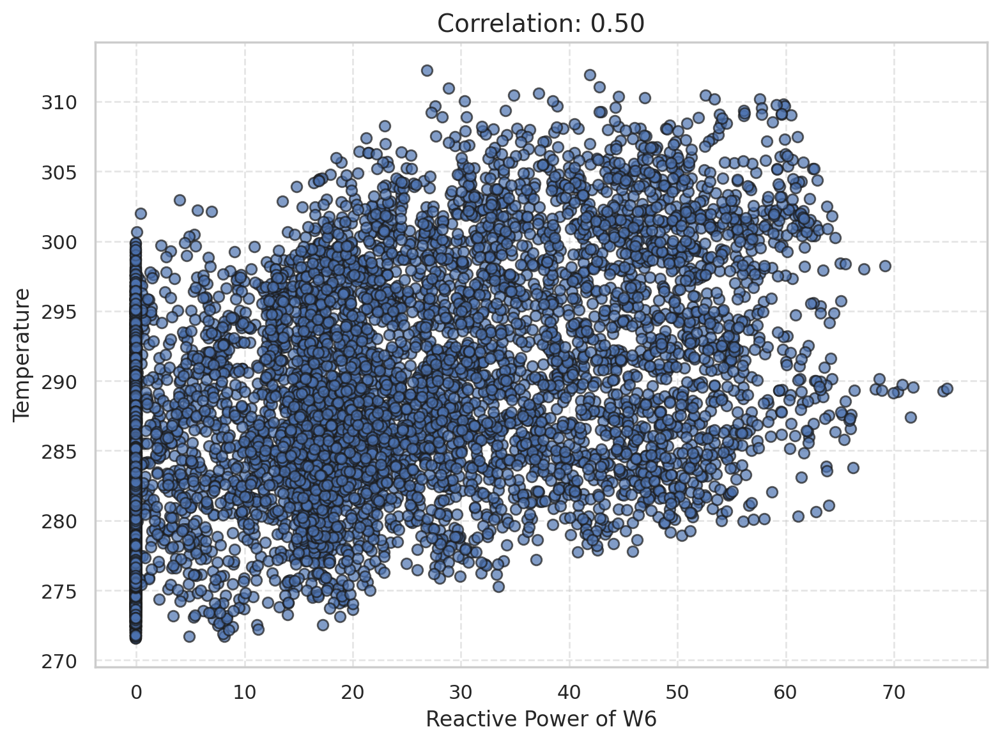

In [108]:
create_corr_plot(power_resampled, 'Reactive Power of W6',weather,'Temperature')

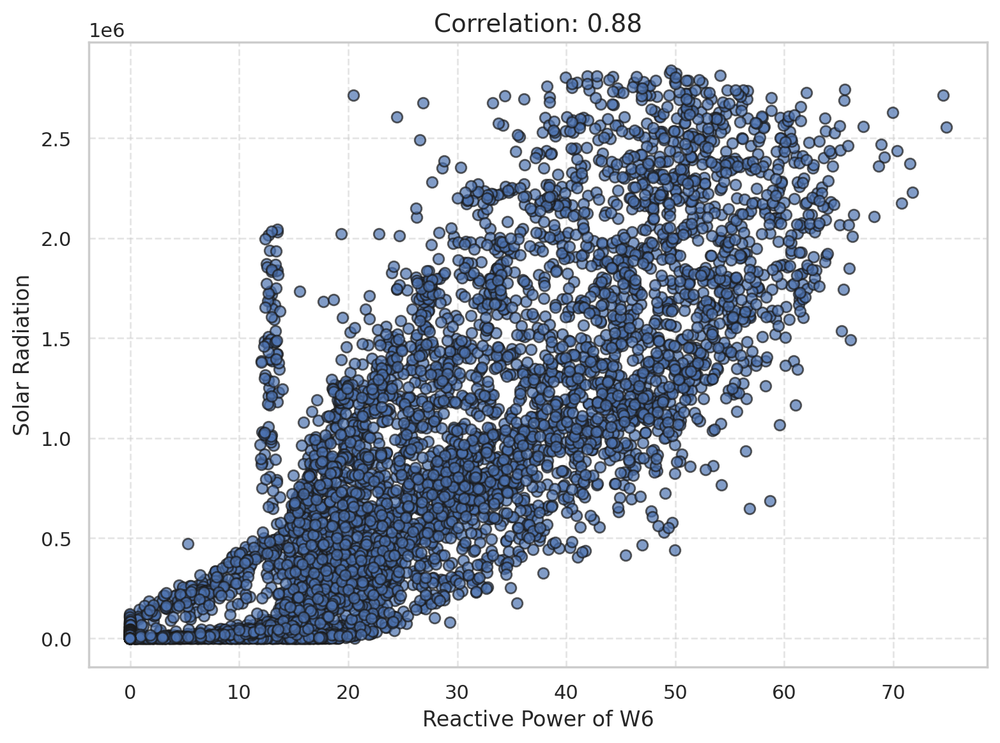

In [109]:
create_corr_plot(power_resampled, 'Reactive Power of W6',weather,'Solar Radiation')

In [ ]:
create_corr_plot(power_resampled, 'Reactive Power of W6',weather,'Cloud Cover')

In [ ]:
create_corr_plot(power_resampled, 'Active Power of W6',weather,'Cloud Cover')

As expected we see a strong correlation between the global radiation and the photovoltaic's power. Also we notice a medium correlation between the temperature and the PV's power.
A very low correlation is noticed betweenthe cloudcover and the pv's power.

##### For W4

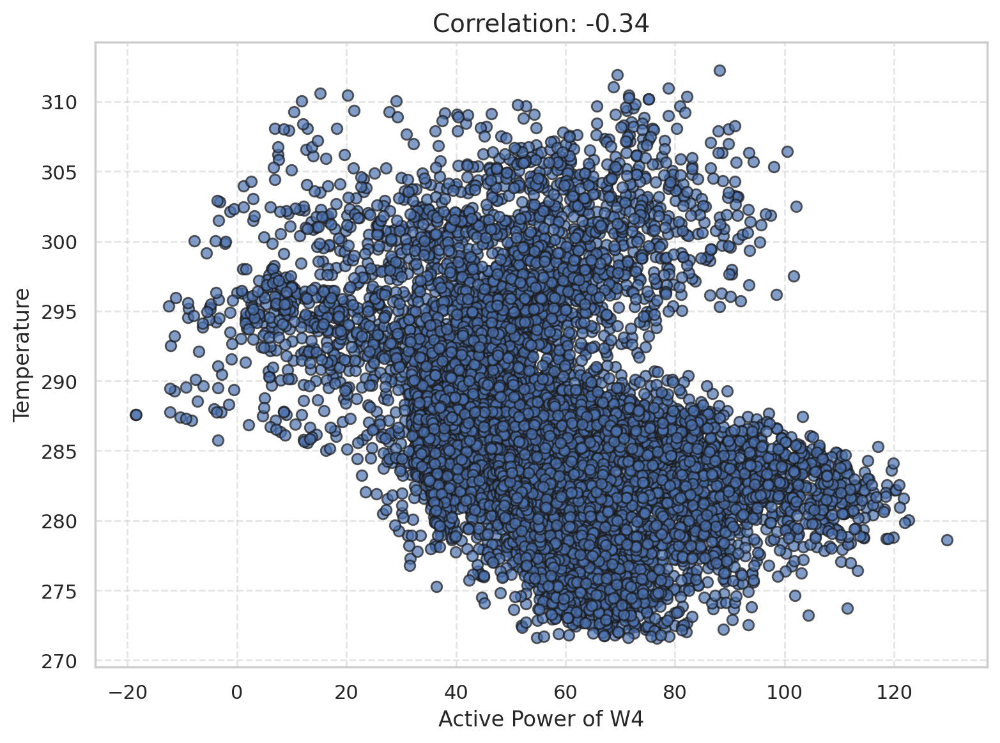

In [112]:
create_corr_plot(power_resampled, 'Active Power of W4',weather,'Temperature')

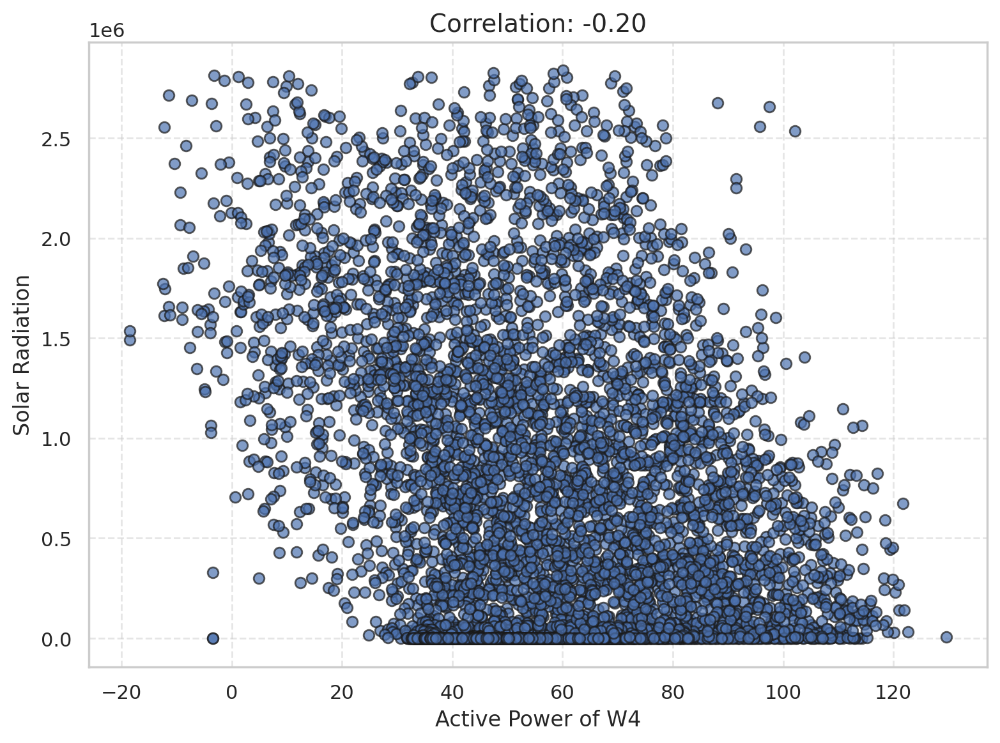

In [113]:
create_corr_plot(power_resampled, 'Active Power of W4',weather,'Solar Radiation')

In [ ]:
create_corr_plot(power_resampled, 'Reactive Power of W4',weather,'Temperature')

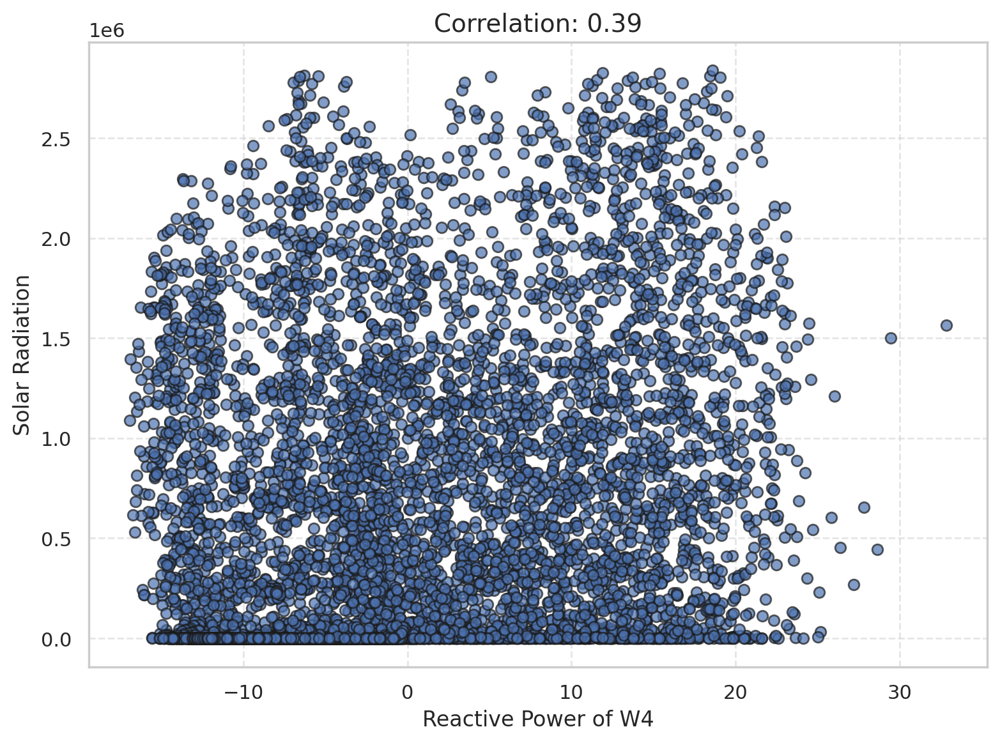

In [125]:
create_corr_plot(power_resampled, 'Reactive Power of W4',weather,'Solar Radiation')

In [ ]:
create_corr_plot(power_resampled, 'Reactive Power of W4',weather,'Cloud Cover')

In [ ]:
create_corr_plot(power_resampled, 'Active Power of W4',weather,'Cloud Cover')

A medium correlation is noticed between the active power of w4 and the temperature, as well as between the reactive power of w4 and the solar radiation. Moreover, a light correlation is found between the active power of W4 and the solar radiation.

### For Future Work

In [ ]:
#create_heatmap(voltage_dt)

We notice that there is a strong positive correlation between all of the voltage phases of the meters. A less stronge correlation is noticed between the phasic voltage of the meter connected to the headquuarter loads ( w4) and every other meter. Lastly absolute positive correlation (1) is observed between the phasic voltages of the battery (w3) and W2 meter.


#### Correlation between current data

In [ ]:
#create_heatmap(current_dt)

As we see there is absolute positive correlation between the phasic currents of the PV and W2. As explained before this was expected.
We also notice a positive correlation, of 0.5 approximately, between the current of the battery and the fast charging station

#### Concatening power, current and voltage dfs into one to view the correlations between them

In [ ]:
#pi = pd.concat([current_dt, power_dt],join='inner',axis=1)

In [ ]:
#pv = pd.concat([voltage_dt, power_dt],join='inner',axis=1)

In [ ]:
#total = pd.concat([pv, current_dt],join='inner',axis=1)

In [ ]:
#create_heatmap(pv)

* There is a strong correlation between the phasic voltages of all meters and both voltage and power data of the battery (w3) and the fast charging station (w5)
* Also strong correlation exists between the current / power of the battery and the power / current of the fast charging station respectively.
* Lastly, also correlated are the current/ power of the pv and the power/ current of w2, respectively.

